### First, we will load the modules and inference data, define some settings, and perform a small amount of preprocessing

In [1]:
import pandas as pd
import matplotlib
import warnings
import os
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
import analysis_utils
from copy import deepcopy

# path to repository folder (data is stored here as well)
path = '..'
preds_loc = os.path.join(path, 'data', 'analysis', 'korpm_analysis.csv')

# default plotting settings
font = {'size'   : 18}
matplotlib.rc('font', **font)

# notebook display options
warnings.filterwarnings('ignore')
pd.options.display.max_rows = 300

remap_names = analysis_utils.remap_names
remap_names_2 = analysis_utils.remap_names_2

db = pd.read_csv(preds_loc).set_index(['uid', 'uid2'])

Original unique mutations: 2369
['mif_dir', 'mifst_dir', 'mpnn_10_00_dir', 'mpnn_20_00_dir', 'mpnn_30_00_dir', 'esmif_multimer_dir', 'esm2_3B_dir', 'esmif_monomer_dir', 'esm2_15B_half_dir', 'msa_1_dir', 'msa_2_dir', 'msa_3_dir', 'msa_4_dir', 'msa_5_dir', 'msa_transformer_median_dir', 'msa_transformer_mean_dir', 'tranception_dir', 'esm2_150M_dir', 'esm2_650M_dir', 'ankh_dir', 'esm1v_1_dir', 'esm1v_2_dir', 'esm1v_3_dir', 'esm1v_4_dir', 'esm1v_5_dir', 'esm1v_median_dir', 'esm1v_mean_dir', 'korpm_dir', 'cartesian_ddg_dir']
['mif_dir', 'mifst_dir', 'mpnn_10_00_dir', 'mpnn_20_00_dir', 'mpnn_30_00_dir', 'esmif_multimer_dir', 'esm2_3B_dir', 'esmif_monomer_dir', 'esm2_15B_half_dir', 'msa_transformer_median_dir', 'msa_transformer_mean_dir', 'tranception_dir', 'esm2_150M_dir', 'esm2_650M_dir', 'ankh_dir', 'esm1v_median_dir', 'esm1v_mean_dir', 'korpm_dir', 'cartesian_ddg_dir']
Detected 40 interface mutations


,,mif_dir,mifst_dir,mpnn_10_00_dir,mpnn_20_00_dir,mpnn_30_00_dir,esmif_multimer_dir,esm2_3B_dir,esmif_monomer_dir,esm2_15B_half_dir,msa_1_dir,...,esm1v_5_dir,esm1v_median_dir,esm1v_mean_dir,korpm_dir,cartesian_ddg_dir,ddG,cluster,mpnn_rosetta_dir,random_dir,ddG_dir
uid,uid2,,,,,,,,,,,,,,,,,,,,,
12CA_145R,12CA_140R,-7.472339,-11.654044,-0.754203,-1.014478,0.222601,0.000611,-13.121611,0.000611,-10.045898,-11.081309,...,-13.287169,-10.042923,-10.626349,0.862,-10.880333,-0.36,63,-11.894811,0.293021,-0.36
1A23_30S,1A23_30S,1.864485,-6.805952,1.862225,2.087240,-1.396025,-0.043713,-11.571676,-0.043713,-11.668701,-8.721450,...,-13.370916,-13.370916,-13.061886,-0.241,-1.324667,-1.80,66,0.762573,0.235462,-1.80
1A23_32L,1A23_32L,1.119251,-7.800102,-0.200148,2.129448,-0.085721,-0.042389,-13.755667,-0.042389,-13.076172,-7.793007,...,-11.998137,-11.998137,-12.214681,0.365,1.818333,-4.60,66,3.947781,-0.843269,-4.60
1A23_32S,1A23_32S,-0.854073,-5.414868,0.188699,0.849972,0.863521,-0.029983,-8.291791,-0.029983,-10.436035,-5.083358,...,-8.345301,-6.640480,-6.917703,-0.181,-4.596000,-5.20,66,-3.746028,-0.560471,-5.20
1A23_33S,1A23_33S,0.348253,-5.093968,0.965242,-0.514806,0.980866,-0.024960,-12.002896,-0.024961,-12.722168,-7.606897,...,-12.898417,-7.950251,-9.768216,-0.848,-2.208667,-1.10,66,-2.723473,0.219979,-1.10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5TR5_33Q,5TR5_33Q,-0.197353,-0.914865,-0.652905,-0.046959,0.548482,-0.000270,-1.666809,-0.000271,-1.537109,-3.267214,...,-6.592246,-3.193152,-3.695140,-0.228,1.595667,-0.65,10,1.548708,-0.536430,-0.65
5TR5_37L,5TR5_37L,-7.014242,-4.624759,-2.038346,-2.644756,-1.633662,-0.141230,-3.879099,-0.141230,-4.250977,-7.255979,...,-1.950832,-3.141888,-3.432956,-0.952,0.726333,-0.29,10,-1.918423,-0.618129,-0.29
5TR5_55I,5TR5_55I,-3.645788,-3.215672,-3.165476,-3.178130,-2.039948,-0.014492,-0.803307,-0.014492,-1.160156,-6.826414,...,-3.179624,-4.646410,-4.617338,-0.128,-0.450000,0.24,10,-3.628130,-0.224687,0.24


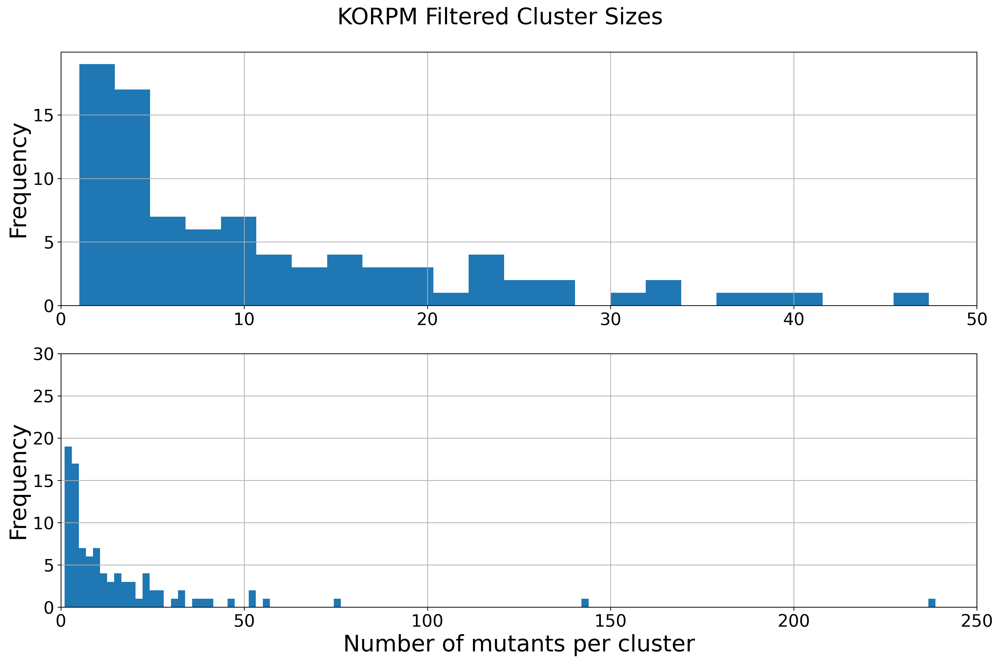

In [2]:
db_class = db

print('Original unique mutations:', len(db_class))

evolutionary = ['tranception', 'msa_transformer', 'esm1v', 'msa', 'esm2', 'ankh']
structural = ['mpnn', 'mif', 'mifst', 'esmif', 'mutcomputex']
supervised = ['MAESTRO', 'ThermoNet', 'INPS', 'PremPS', 'mCSM', 'DUET', 'ACDC', 'I-Mutant3.0', 'SAAFEC', 'MuPro', 'q3421']
untrained = ['DDGun']
potential = ['KORPM', 'PopMusic', 'SDM', 'korpm']
biophysical = ['cartesian_ddg', 'FoldX', 'Evo', 'Cartddg']
transfer = ['stability-oracle']

original_pred_cols = db_class.columns[db_class.columns.str.contains('|'.join(evolutionary + structural + supervised + untrained + potential + biophysical + transfer))]
original_pred_cols = list(original_pred_cols.drop(['reduced_msa_file', 'full_msa_file', 'tranception_dms', 'msa_weights']))
original_pred_cols = [c for c in original_pred_cols if not 'runtime' in c]
original_pred_cols = [c for c in original_pred_cols if not 'cluster' in c]
original_pred_cols = [c for c in original_pred_cols if not 'overlaps' in c]
original_pred_cols = [c for c in original_pred_cols if not 'pll' in c]
print(original_pred_cols)

db_runtimes = db[[c for c in db.columns if 'runtime' in c]]

original_pred_cols_reduced = deepcopy(original_pred_cols)
for col in [f'esm1v_{i}_dir' for i in range(1,6)]:
    original_pred_cols_reduced.remove(col)
for col in [f'msa_{i}_dir' for i in range(1,6)]:
    original_pred_cols_reduced.remove(col)

print(original_pred_cols_reduced)

db_class = db_class[original_pred_cols + ['ddG', 'cluster']]

db_class_rescaled = db_class.copy(deep=True)
db_class_rescaled[original_pred_cols] /= db_class_rescaled[original_pred_cols].std()

db_class['mpnn_rosetta_dir'] = db_class['cartesian_ddg_dir'] + db_class['mpnn_20_00_dir']
db_class['random_dir'] = np.random.normal(loc=0, size=len(db_class))
#db_class['korpm_dir'] = db_class['KORPMD_dir']
db_class['ddG_dir'] = db_class['ddG']

#db_class = db_class.drop([c+'_dir' for c in ['ACDCNND', 'FoldXD', 'DDGunD', 'CartddgD']], axis=1) #'PopMsD', 'TNetD'

print(f'Detected {len(db_class.loc[db["on_interface_dir"].astype(bool)])} interface mutations')

fig, axes = plt.subplots(2, figsize=(15, 10), dpi=300) 

db_class.groupby('cluster').count().iloc[:, 0].hist(bins=400, ax=axes[0])
axes[0].set_xlim([0, 50])  # Set x-axis limits for the first plot
axes[0].tick_params(axis='x', labelsize=18)  # Set x-tick label size for the first plot
axes[0].set_ylabel('Frequency', fontsize=24)  # Set y-label for the first plot

# Second plot
db_class.groupby('cluster').count().iloc[:, 0].hist(bins=400, ax=axes[1])
axes[1].set_xlim([0, 250]) 
axes[1].set_ylim([0, 30])  # Set x-axis limits for the first plot
axes[1].set_xlabel('Number of mutants per cluster', fontsize=24) 
axes[1].set_ylabel('Frequency', fontsize=24)
axes[1].tick_params(axis='x', labelsize=18)

plt.suptitle('KORPM Filtered Cluster Sizes', fontsize=24)
plt.tight_layout()

db_class

In [3]:
# Clusters with >= or < 50 unique mutants
print((db_class.groupby('cluster').count().iloc[:, 0] >= 50).sum(), (db_class.groupby('cluster').count().iloc[:, 0] < 50).sum())

7 89


### Recursive Feature Addition (Figure 3C)

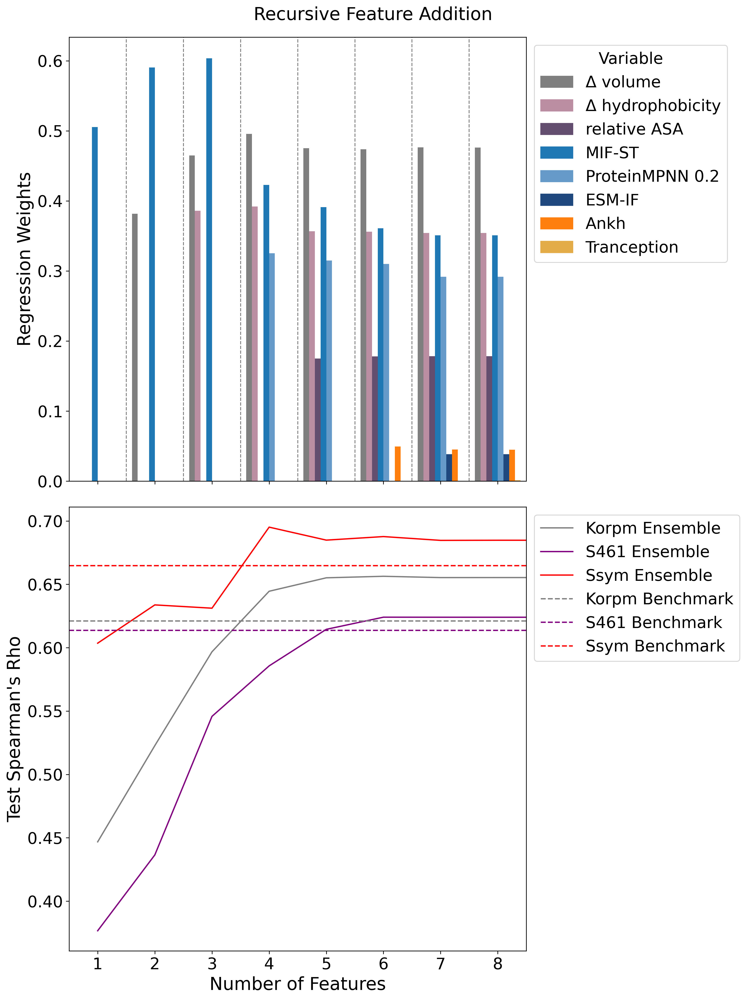

In [4]:
from sklearn.linear_model import Ridge, LinearRegression
from sklearn.kernel_ridge import KernelRidge
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler, MinMaxScaler, PolynomialFeatures
import importlib
importlib.reload(analysis_utils)

cols2 = ['delta_kdh_dir', 'delta_vol_dir', 'rel_ASA_dir', 'esmif_multimer_dir', 'mpnn_20_00_dir', 'mif_dir', 'mifst_dir', 'msa_transformer_mean_dir', 'esm2_650M_dir', 'ankh_dir', 'tranception_dir'] #'mutcomputex_dir',
df_train = db.drop(['cluster','ddG'], axis=1).fillna(0) #.join(db_feats_2[[c for c in db_feats_2.columns if c in cols2]]).join(db_training).dropna(subset='ddG_dir').fillna(0)
df_train = df_train.loc[~df_train['overlaps_seq_ssym']].loc[~df_train['overlaps_seq_s461']]
df_test = db.drop(['cluster','ddG'], axis=1).fillna(0) #.join(db_feats_2[[c for c in db_feats_2.columns if c in cols2]]).join(db_training).dropna(subset='ddG_dir').fillna(0).drop(['ProTherm', 'ddG'], axis=1).fillna(0)
df_test_s461 = pd.read_csv(os.path.join(path, 'data', 'analysis', 's461_analysis.csv')).set_index('uid')
df_test_s461 = df_test_s461[[c for c in df_test_s461.columns if not 'korpm' in c and not 'rfa_' in c]]
df_test_s461.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA'] else c for c in df_test_s461.columns]
df_test_ssym = pd.read_csv(os.path.join(path, 'data', 'analysis', 'ssym_analysis.csv')).set_index('uid')
df_test_ssym = df_test_ssym[[c for c in df_test_ssym.columns if not 'korpm' in c and not 'rfa_' in c]]
#df_test_ssym.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA', 'ddG'] else c for c in df_test_ssym.columns]
df_test_ssym.columns = [c+'_dir' for c in df_test_ssym.columns]

dfs_test = {'korpm': df_test, 's461': df_test_s461, 'ssym': df_test_ssym}

test_scores, weights_df, dfs_test = analysis_utils.custom_recursive_feature_addition(df_train, dfs_test, cols2, 'ddG_dir', LinearRegression(positive=True), fillna=True, source='korpm_pslm')

df_test_korpm = dfs_test['korpm']
df_test_korpm = df_test_korpm.rename(dict(zip([c for c in df_test_korpm.columns if 'rfa_' in c], [c+'_dir' for c in df_test_korpm.columns if 'rfa_' in c])), axis=1)
db_class = db_class[[c for c in db_class.columns if not 'korpm_pslm' in c]]
db_class = db_class.join(df_test_korpm[[c for c in df_test_korpm.columns if 'rfa_' in c]])

df_test_s461 = dfs_test['s461']
df_test_s461 = df_test_s461.rename(dict(zip([c for c in df_test_s461.columns if 'rfa_' in c], [c+'_dir' for c in df_test_s461.columns if 'rfa_' in c])), axis=1)
df_test_s461.to_csv(os.path.join(path, 'data', 'inference', 's461_analysis.csv'))

df_test_ssym = dfs_test['ssym']
df_test_ssym = df_test_ssym.rename(dict(zip([c for c in df_test_ssym.columns if '_dir' in c], [c[:-4] for c in df_test_ssym.columns if '_dir' in c])), axis=1)
df_test_ssym.to_csv(os.path.join(path, 'data', 'inference', 'ssym_analysis.csv'))

### Recursive Feature Addition (All Models) (Supplementary Figure 9)

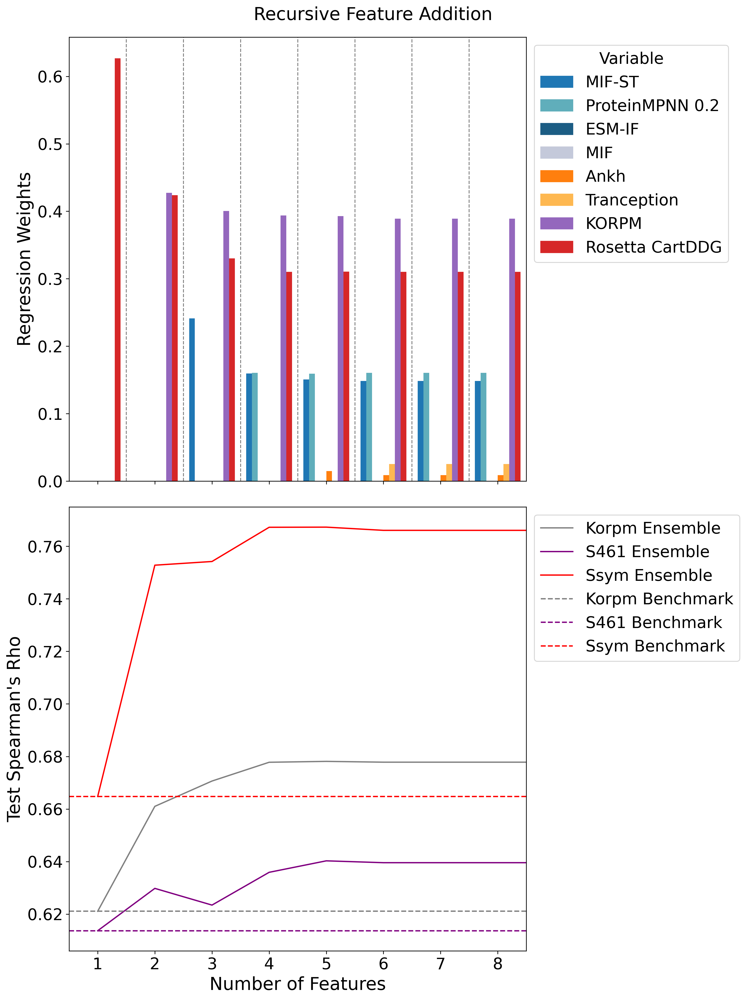

In [5]:
cols2 = ['cartesian_ddg_dir', 'korpm_dir', 'esmif_multimer_dir', 'mpnn_20_00_dir', 'mpnn_30_00_dir', 'esm2_3B_dir', 'mifst_dir', 'mif_dir', 'msa_transformer_mean_dir', 'esm2_650M_dir', 'ankh_dir', 'tranception_dir']#, 'mutcomputex_dir']
df_train = db.drop(['cluster','ddG'], axis=1).fillna(0) #.join(db_feats_2[[c for c in db_feats_2.columns if c in cols2]]).join(db_training).dropna(subset='ddG_dir').fillna(0)
df_train = df_train.loc[~df_train['overlaps_seq_ssym']].loc[~df_train['overlaps_seq_s461']]
df_test = db.drop(['cluster','ddG'], axis=1).fillna(0) #.join(db_feats_2[[c for c in db_feats_2.columns if c in cols2]]).join(db_training).dropna(subset='ddG_dir').fillna(0).drop(['ProTherm', 'ddG'], axis=1).fillna(0)
df_test_s461 = pd.read_csv(os.path.join(path, 'data', 'analysis', 's461_analysis.csv')).set_index('uid')
df_test_s461 = df_test_s461[[c for c in df_test_s461.columns if not 'korpm_all' in c]]
df_test_s461.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA'] else c for c in df_test_s461.columns]
df_test_ssym = pd.read_csv(os.path.join(path, 'data', 'analysis', 'ssym_analysis.csv')).set_index('uid')
df_test_ssym = df_test_ssym[[c for c in df_test_ssym.columns if not 'korpm_all' in c]]
#df_test_ssym.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA', 'ddG'] else c for c in df_test_ssym.columns]
df_test_ssym.columns = [c+'_dir' for c in df_test_ssym.columns]

dfs_test = {'korpm': df_test, 's461': df_test_s461, 'ssym': df_test_ssym}

test_scores, weights_df, dfs_test = analysis_utils.custom_recursive_feature_addition(df_train, dfs_test, cols2, 'ddG_dir', LinearRegression(positive=True), fillna=True, source='korpm_all')

df_test_korpm = dfs_test['korpm']
df_test_korpm = df_test_korpm.rename(dict(zip([c for c in df_test_korpm.columns if 'rfa_' in c], [c+'_dir' for c in df_test_korpm.columns if 'rfa_' in c])), axis=1)
db_class = db_class[[c for c in db_class.columns if not 'korpm_all' in c]]
db_class = db_class.join(df_test_korpm[[c for c in df_test_korpm.columns if 'rfa_' in c]])

df_test_s461 = dfs_test['s461']
df_test_s461 = df_test_s461.rename(dict(zip([c for c in df_test_s461.columns if 'rfa_' in c], [c+'_dir' for c in df_test_s461.columns if 'rfa_' in c])), axis=1)
df_test_s461.to_csv(os.path.join(path, 'data', 'analysis', 's461_analysis.csv'))

df_test_ssym = dfs_test['ssym']
df_test_ssym = df_test_ssym.rename(dict(zip([c for c in df_test_ssym.columns if '_dir' in c], [c[:-4] for c in df_test_ssym.columns if '_dir' in c])), axis=1)
df_test_ssym.to_csv(os.path.join(path, 'data', 'analysis', 'ssym_analysis.csv'))

In [6]:
drop_cols = [c for c in db_class.columns if 'korpm_pslm' in c and not '5' in c]
drop_cols += [c for c in db_class.columns if 'korpm_all' in c and not '5' in c]
db_class = db_class.drop(drop_cols, axis=1)
db_class

,,mif_dir,mifst_dir,mpnn_10_00_dir,mpnn_20_00_dir,mpnn_30_00_dir,esmif_multimer_dir,esm2_3B_dir,esmif_monomer_dir,esm2_15B_half_dir,msa_1_dir,...,esm1v_mean_dir,korpm_dir,cartesian_ddg_dir,ddG,cluster,mpnn_rosetta_dir,random_dir,ddG_dir,korpm_pslm_rfa_5_dir,korpm_all_rfa_5_dir
uid,uid2,,,,,,,,,,,,,,,,,,,,,
12CA_145R,12CA_140R,-7.472339,-11.654044,-0.754203,-1.014478,0.222601,0.000611,-13.121611,0.000611,-10.045898,-11.081309,...,-10.626349,0.862,-10.880333,-0.36,63,-11.894811,0.293021,-0.36,-0.299253,-0.415317
1A23_30S,1A23_30S,1.864485,-6.805952,1.862225,2.087240,-1.396025,-0.043713,-11.571676,-0.043713,-11.668701,-8.721450,...,-13.061886,-0.241,-1.324667,-1.80,66,0.762573,0.235462,-1.80,-0.575849,0.019297
1A23_32L,1A23_32L,1.119251,-7.800102,-0.200148,2.129448,-0.085721,-0.042389,-13.755667,-0.042389,-13.076172,-7.793007,...,-12.214681,0.365,1.818333,-4.60,66,3.947781,-0.843269,-4.60,0.419953,0.451047
1A23_32S,1A23_32S,-0.854073,-5.414868,0.188699,0.849972,0.863521,-0.029983,-8.291791,-0.029983,-10.436035,-5.083358,...,-6.917703,-0.181,-4.596000,-5.20,66,-3.746028,-0.560471,-5.20,-0.404675,-0.141294
1A23_33S,1A23_33S,0.348253,-5.093968,0.965242,-0.514806,0.980866,-0.024960,-12.002896,-0.024961,-12.722168,-7.606897,...,-9.768216,-0.848,-2.208667,-1.10,66,-2.723473,0.219979,-1.10,-0.839556,-0.409498
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5TR5_33Q,5TR5_33Q,-0.197353,-0.914865,-0.652905,-0.046959,0.548482,-0.000270,-1.666809,-0.000271,-1.537109,-3.267214,...,-3.695140,-0.228,1.595667,-0.65,10,1.548708,-0.536430,-0.65,0.128101,0.280180
5TR5_37L,5TR5_37L,-7.014242,-4.624759,-2.038346,-2.644756,-1.633662,-0.141230,-3.879099,-0.141230,-4.250977,-7.255979,...,-3.432956,-0.952,0.726333,-0.29,10,-1.918423,-0.618129,-0.29,0.297722,-0.396573
5TR5_55I,5TR5_55I,-3.645788,-3.215672,-3.165476,-3.178130,-2.039948,-0.014492,-0.803307,-0.014492,-1.160156,-6.826414,...,-4.617338,-0.128,-0.450000,0.24,10,-3.628130,-0.224687,0.24,0.284853,-0.080058


In [7]:
import importlib
importlib.reload(analysis_utils)
remap_names_2 = analysis_utils.remap_names_2
remap_names_2

{'esmif_monomer_dir': 'ESM-IF(M)',
 'esmif_multimer_dir': 'ESM-IF',
 'mpnn_mean_dir': 'ProteinMPNN mean',
 'esm2_mean_dir': 'ESM-2 mean',
 'esmif_mean_dir': 'ESM-IF mean',
 'mif_mean_dir': 'MIF mean',
 'msa_transformer_mean_dir': 'MSA-T mean',
 'msa_transformer_median_dir': 'MSA-T median',
 'esm1v_mean_dir': 'ESM-1V mean',
 'esm1v_median_dir': 'ESM-1V median',
 'esm2_150M_dir': 'ESM-2 150M',
 'esm2_650M_dir': 'ESM-2 650M',
 'esm2_3B_dir': 'ESM-2 3B',
 'esm2_15B_half_dir': 'ESM-2 15B',
 'mif_dir': 'MIF',
 'mifst_dir': 'MIF-ST',
 'monomer_ddg_dir': 'Ros_ddG_monomer',
 'cartesian_ddg_dir': 'Rosetta CartDDG',
 'mpnn_10_00_dir': 'ProteinMPNN 0.1',
 'mpnn_20_00_dir': 'ProteinMPNN 0.2',
 'mpnn_30_00_dir': 'ProteinMPNN 0.3',
 'mpnn_sol_10_00_dir': 'ProteinMPNN_sol 0.1',
 'mpnn_sol_20_00_dir': 'ProteinMPNN_sol 0.2',
 'mpnn_sol_30_00_dir': 'ProteinMPNN_sol 0.3',
 'tranception_dir': 'Tranception',
 'tranception_weights_dir': 'Tranception reweighted',
 'tranception_original_dir': 'Tranception_orig

### Non-bootstrapped Analysis of KORPM Filtered (not in text)

In [8]:
# TABLE 1
# Note: due to changes in the dependencies and small changes to preprocessing,
# results have changed very slightly from the current revision, but do not affect
# the interpretation of results or conclusions

# could replace stats=() with ('n', 'MCC', 'auprc', 'ndcg', 'spearman')
# but then you would not be saving the other stats. 
# uncomment to_csv lines to save to a custom location
#db_class['code'] = db_class.index.str[:4]
summ = analysis_utils.compute_stats(db_class, 
                                    stats=('n', 'MCC', 'pred_positives', 'tp', 'auprc', 'spearman', 'ndcg', 'mean_t1s', 'mean_reciprocal_rank', 'mean_stabilization', 'net_stabilization', 'sensitivity', 'tp', 'recall@k1.0', 'aumsc', 'auppc'), 
                                    measurements=['ddG'], grouper='cluster', n_classes=2, n_bootstraps=0)
rcv = summ.copy(deep=True)
#summ.to_csv('../data/extended/q3421_extended.csv')
tmp1 = summ #.loc[:,['n', 'MCC', 'auprc', 'spearman', 'weighted_ndcg', 'weighted_auprc', 'weighted_spearman']]
tmp = tmp1.sort_values(['measurement', 'weighted_spearman'], ascending=False).reset_index()

tmp['model'] = tmp['model'].map(remap_names_2)
tmp['measurement'] = tmp['measurement'].map({'ddG': 'ΔΔG', 'dTm': 'ΔTm'})
tmp.loc[tmp['model'].isin(['Gaussian noise', 'ΔΔG', 'ΔTm']), 'model_type'] = 'N/A'

remap_cols = {'auprc': 'AUPRC', 'spearman': 'ρ', 'auppc': 'mean PPC', 'aumsc': 'mean MSC', 'weighted_ndcg': 'wNDCG', 
    'weighted_spearman': 'wρ', 'weighted_auprc': 'wAUPRC', 'tp': 'True Positives', 'sensitivity': 'Sensitivity', 
    'net_stabilization': 'Net Stabilization', 'accuracy': 'Accuracy', 'mean_reciprocal_rank': 'MRR'}
tmp = tmp.rename(remap_cols, axis=1)
tmp = tmp[['measurement', 'model_type', 'model', 'n', 'MCC', 'AUPRC', 'ρ', 'wNDCG', 'wAUPRC', 'wρ', 'mean_t1s', 'Net Stabilization', 'pred_positives', 
 'mean_stabilization', 'True Positives', 'Sensitivity', 'MRR', 'recall@k1.0']]#, 'Accuracy']]
tmp = tmp.loc[tmp['model'].isin(['Rosetta CartDDG', 'ProteinMPNN mean', 'ProteinMPNN 0.3', 'ProteinMPNN 0.2', 'ESM-IF', 'MIF', 'ESM-IF(M)', 'Ankh', 
    'ESM-2 3B', 'ESM-2 15B', 'Structural', 'Evolutionary', 'Supervised', 'ESM-2 150M', 'ESM-2 650M', 'Ensemble', 'ESM-2 mean', 'ESM-IF mean', 
    'MIF mean', 'Clustered Ensemble', 'Ensemble 2', 'ProteinMPNN 0.2', 'MIF-ST', 'KORPM', 'MSA-T mean', 'MSA-T 1', 'Tranception', 'Tranception reweighted', 'ESM-1V mean', 
    'ESM-1V 2', 'Gaussian Noise', 'ΔΔG label', 'ΔTm label', 'Rosetta/ProtMPNN', 'Stability_Oracle', 'MutComputeX'])]
tmp = tmp.dropna(subset='model').set_index(['measurement', 'model_type', 'model']).astype(float).round(3)
tmp

# ~ 4 minutes

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

n    MCC  AUPRC      ρ  wNDCG  \
measurement model_type   model                                                  
ΔΔG         unknown      ΔΔG label         2369.0  1.000  1.000  1.000  1.000   
            structural   Rosetta/ProtMPNN  2369.0  0.340  0.745  0.643  0.757   
            biophysical  Rosetta CartDDG   2369.0  0.364  0.702  0.621  0.738   
            potential    KORPM             2369.0  0.382  0.676  0.552  0.745   
            structural   ProteinMPNN 0.3   2369.0  0.264  0.634  0.442  0.741   
                         MIF               2369.0  0.240  0.622  0.442  0.700   
                         ProteinMPNN 0.2   2369.0  0.287  0.648  0.449  0.729   
                         ESM-IF            2369.0  0.244  0.615  0.354  0.706   
                         ESM-IF(M)         2369.0  0.232  0.610  0.345  0.712   
                         MIF-ST            2369.0  0.223  0.627  0.447  0.709   
            evolutionary ESM-2 650M        2369.0  0.183  0.554  0.288  0.696   
                         ESM-2 3B          2369.0  0.144  0.547  0.302  0.680   
                         ESM-2 15B         2369.0  0.172  0.573  0.350  0.670   
                         MSA-T 1           2369.0  0.155  0.561  0.312  0.669   
                         ESM-2 150M        2369.0  0.154  0.523  0.195  0.680   
                         MSA-T mean        2369.0  0.153  0.557  0.308  0.663   
                         ESM-1V mean       2369.0  0.161  0.538  0.220  0.663   
                         Ankh              2369.0  0.197  0.577  0.347  0.668   
                         Tranception       2365.0  0.111  0.535  0.321  0.673   
                         ESM-1V 2          2369.0  0.169  0.533  0.211  0.647   
            unknown      Gaussian Noise    2369.0  0.001  0.417  0.019  0.603   

                                           wAUPRC     wρ  mean_t1s  \
measurement model_type   model                                       
ΔΔG         unknown      ΔΔG label          0.929  1.000     0.924   
            structural   Rosetta/ProtMPNN   0.739  0.537     0.142   
            biophysical  Rosetta CartDDG    0.693  0.496     0.096   
            potential    KORPM              0.684  0.458     0.081   
            structural   ProteinMPNN 0.3    0.674  0.451     0.111   
                         MIF                0.661  0.437    -0.047   
                         ProteinMPNN 0.2    0.683  0.430     0.053   
                         ESM-IF             0.649  0.423    -0.044   
                         ESM-IF(M)          0.648  0.414    -0.002   
                         MIF-ST             0.640  0.377    -0.109   
            evolutionary ESM-2 650M         0.619  0.316    -0.159   
                         ESM-2 3B           0.627  0.309    -0.101   
                         ESM-2 15B          0.616  0.298    -0.141   
                         MSA-T 1            0.616  0.274    -0.129   
                         ESM-2 150M         0.594  0.272    -0.333   
                         MSA-T mean         0.613  0.269    -0.151   
                         ESM-1V mean        0.595  0.255    -0.366   
                         Ankh               0.603  0.244    -0.282   
                         Tranception        0.595  0.239    -0.227   
                         ESM-1V 2           0.586  0.211    -0.464   
            unknown      Gaussian Noise     0.475  0.017    -0.686   

                                           Net Stabilization  pred_positives  \
measurement model_type   model                                                 
ΔΔG         unknown      ΔΔG label                   609.758           991.0   
            structural   Rosetta/ProtMPNN            181.860           375.0   
            biophysical  Rosetta CartDDG             167.914           610.0   
            potential    KORPM                       126.098           723.0   
            structural   ProteinMPNN 0.3             101.157           436.0   
             

### Recovery Curves (Visualization of Stable Mutant Enrichment, Figure 2)

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

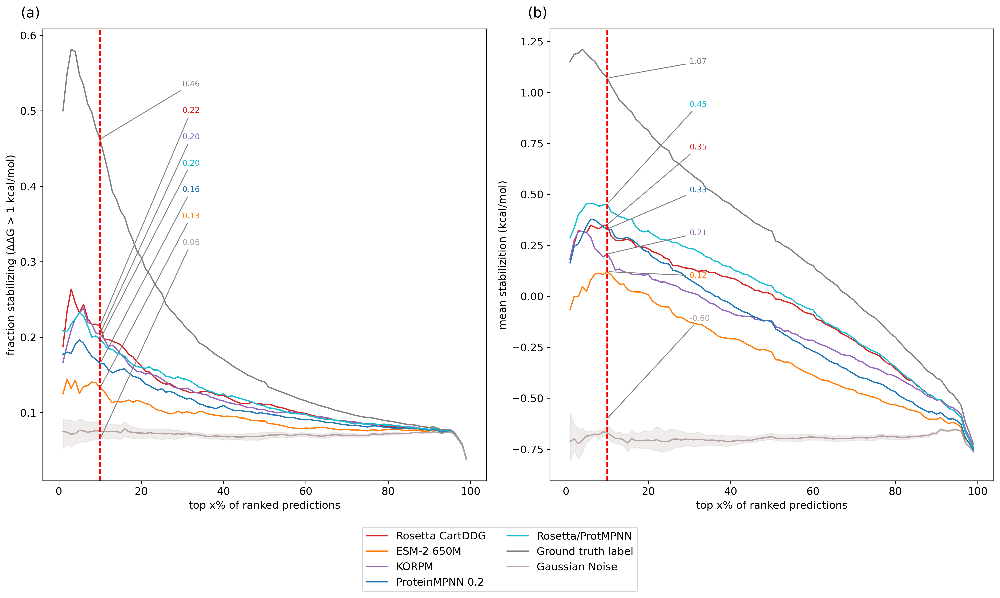

In [9]:
db_class_r = db_class.copy(deep=True)
db_class_r['random_2_dir'] = np.random.normal(loc=0, size=len(db_class_r))
db_class_r['random_3_dir'] = np.random.normal(loc=0, size=len(db_class_r))
db_class_r['random_4_dir'] = np.random.normal(loc=0, size=len(db_class_r))
db_class_r['random_5_dir'] = np.random.normal(loc=0, size=len(db_class_r))
class_result_new = analysis_utils.compute_stats(db_class_r, stats=('aumsc', 'auppc'), measurements=['ddG'], grouper='cluster', n_bootstraps=0)
crn = class_result_new.reset_index()
crn.loc[crn['model'].str.contains('random'), 'model'] = 'random_dir'
crn = crn.set_index(['measurement', 'model_type', 'model'])
crn
analysis_utils.recovery_curves(crn, ['mpnn_20_00_dir', 'cartesian_ddg_dir', 'mpnn_rosetta_dir', 'korpm_dir', 'esm2_650M_dir', 'ddG_dir', 'random_dir'], spacing=0.07, measurements=['ddG'], plots=['auppc', 'aumsc']) #'q3421_pslm_rfa_5_dir', 'stability-oracle_dir',

# < 4 minutes

### Recovery Curves (Visualization of Stable Mutant Enrichment, Supplementary Figure 6)

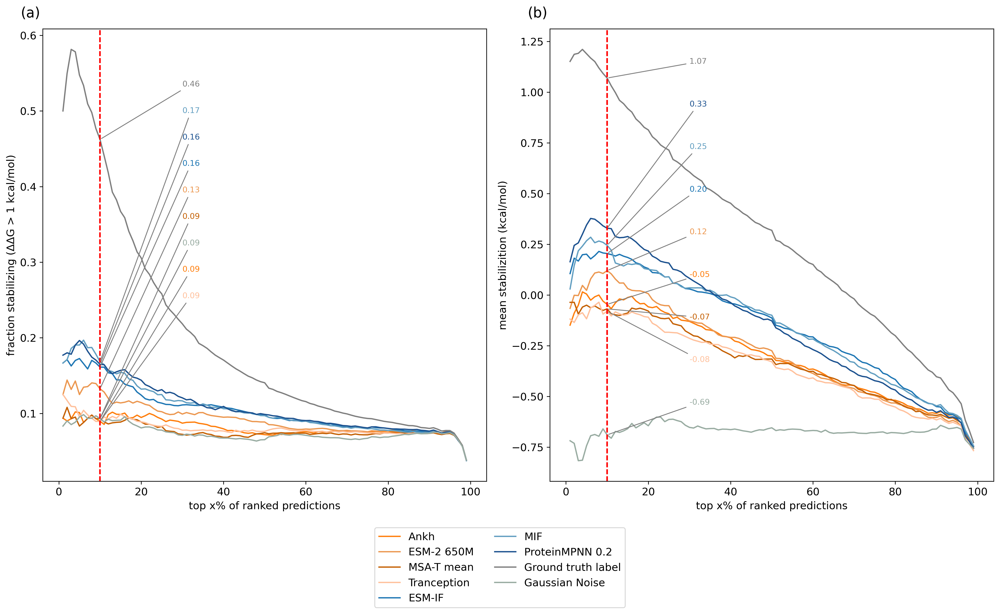

In [10]:
analysis_utils.recovery_curves(class_result_new, ['mpnn_20_00_dir', 'mif_dir', 'esmif_multimer_dir', 'ankh_dir', 'msa_transformer_mean_dir', 'esm2_650M_dir', 'tranception_dir', 'mutcomputex_dir', 'ddG_dir', 'random_dir'], spacing=0.07, measurements=['ddG'], plots=['auppc', 'aumsc'])

### Bootstrapped Q3421 Analysis (Used for Figure 1 and Extended Data Table 1)

In [11]:
summ = analysis_utils.compute_stats(db_class, 
                                    stats=('n', 'MCC', 'tp', 'fp', 'tn', 'fn', 'auprc', 'spearman', 'ndcg', 'mean_t1s', 'mean_reciprocal_rank', 'mean_stabilization', 'net_stabilization', 'sensitivity', 'recall@k0.0', 'recall@k1.0'), 
                                    measurements=['ddG'], grouper='cluster', n_classes=2, n_bootstraps=5, quiet=True)
tmp1 = summ.reset_index()
#tmp1.to_csv('../data/extended/q3421_extended_bootstrapped.csv')

# < 1 minute

In [12]:
remap_names = analysis_utils.remap_names
remap_names_2 = analysis_utils.remap_names_2

remap_cols = {'auprc': 'AUPRC', 'spearman': 'Spearman\'s ρ', 'auppc': 'mean PPC', 'aumsc': 'mean MSC', 'weighted_ndcg': 'wNDCG', 'ndcg': 'NDCG',
    'weighted_spearman': 'wρ', 'weighted_auprc': 'wAUPRC', 'tp': 'True Positives', 'sensitivity': 'Sensitivity', 'mean_stabilization': 'Mean Stabilization',
    'net_stabilization': 'Net Stabilization', 'accuracy': 'Accuracy', 'mean_reciprocal_rank': 'MRR', 'n': 'n', 'MCC': 'MCC', 'recall@k1.0': 'Recall @ k'}

new_remap_cols = {}
for key, value in remap_cols.items():
    new_remap_cols[key + '_mean'] = value + ' mean'
    new_remap_cols[key + '_std'] = value + ' stdev'

s2 = tmp1.sort_values('net_stabilization_mean', ascending=False).dropna(how='all', axis=1).reset_index()
s3 = s2.loc[s2['model'].isin(original_pred_cols_reduced + [
            'random_dir', 
            'ddG_dir', 
            'q3421_pslm_rfa_2_dir', 
            'q3421_pslm_rfa_3_dir', 
            'q3421_pslm_rfa_4_dir',
            'q3421_pslm_rfa_5_dir',
            'mpnn_rosetta_dir'])
            ].drop('measurement', axis=1)

s4 = s3[['model_type', 'model', 
    'recall@k1.0_mean', 'recall@k1.0_std',
    'ndcg_mean', 'ndcg_std',
    'weighted_ndcg_mean', 'weighted_ndcg_std',
    'spearman_mean', 'spearman_std',
    'weighted_spearman_mean', 'weighted_spearman_std',
    'auprc_mean', 'auprc_std', 
    'MCC_mean', 'MCC_std', 
    'mean_stabilization_mean', 'mean_stabilization_std', 
    'net_stabilization_mean', 'net_stabilization_std',
    ]]
s4['model'] = s4['model'].map(remap_names_2)
s5 = s4.set_index(['model_type', 'model'])
s5.columns = [new_remap_cols[c] for c in s5.columns]
s5
# Iterate over the DataFrame and update the mean columns
for column in s5.columns:
    if 'mean' in column:
        stdev_column = column.replace('mean', 'stdev')
        s5[column] = s5[column].round(3).astype(str) + ' ± ' + s5[stdev_column].round(2).astype(str)

# Drop the standard deviation columns
s5 = s5[[col for col in s5.columns if 'stdev' not in col]]
s5.columns = [col[:-5] for col in s5.columns]
s6 = s5.reset_index().rename({'model_type': 'Model Type', 'model': 'Model'}, axis=1)
#s6.to_csv('../data/extended/q3421_extended_bootstrapped_formatted.csv')
s6

,Model Type,Model,Recall @ k,NDCG,wNDCG,Spearman's ρ,wρ,AUPRC,MCC,Mean Stabilization,Net Stabilization
0,unknown,ΔΔG label,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,0.634 ± 0.12,1428.597 ± 712.35
1,structural,Rosetta/ProtMPNN,0.3 ± 0.06,0.86 ± 0.02,0.767 ± 0.02,0.663 ± 0.04,0.522 ± 0.03,0.736 ± 0.03,0.346 ± 0.06,0.416 ± 0.17,397.442 ± 214.67
2,biophysical,Rosetta CartDDG,0.349 ± 0.06,0.838 ± 0.02,0.745 ± 0.01,0.621 ± 0.04,0.474 ± 0.03,0.681 ± 0.05,0.364 ± 0.02,0.21 ± 0.16,353.31 ± 319.53
3,structural,ProteinMPNN 0.2,0.294 ± 0.03,0.83 ± 0.03,0.738 ± 0.02,0.495 ± 0.08,0.42 ± 0.05,0.645 ± 0.03,0.304 ± 0.06,0.238 ± 0.25,288.402 ± 274.95
4,structural,ProteinMPNN 0.1,0.282 ± 0.04,0.837 ± 0.04,0.741 ± 0.03,0.491 ± 0.07,0.406 ± 0.04,0.635 ± 0.03,0.277 ± 0.07,0.279 ± 0.22,285.368 ± 221.64
5,potential,KORPM,0.287 ± 0.03,0.821 ± 0.02,0.771 ± 0.01,0.56 ± 0.03,0.458 ± 0.02,0.665 ± 0.04,0.393 ± 0.03,0.119 ± 0.08,251.887 ± 279.83
6,structural,ESM-IF,0.225 ± 0.05,0.797 ± 0.03,0.706 ± 0.02,0.437 ± 0.08,0.405 ± 0.03,0.603 ± 0.04,0.254 ± 0.04,0.295 ± 0.12,243.993 ± 165.95
7,structural,MIF-ST,0.239 ± 0.06,0.804 ± 0.03,0.705 ± 0.0,0.489 ± 0.05,0.355 ± 0.05,0.619 ± 0.06,0.243 ± 0.05,0.312 ± 0.12,243.827 ± 173.98
8,structural,ESM-IF(M),0.236 ± 0.07,0.803 ± 0.03,0.71 ± 0.02,0.43 ± 0.09,0.397 ± 0.03,0.599 ± 0.04,0.239 ± 0.04,0.266 ± 0.13,226.211 ± 163.81
9,evolutionary,Ankh,0.187 ± 0.04,0.75 ± 0.04,0.677 ± 0.0,0.399 ± 0.09,0.244 ± 0.06,0.568 ± 0.04,0.215 ± 0.07,0.33 ± 0.2,196.404 ± 166.09


### Visualization of Prediction Distributions (Supplementary Figure 1)

      cluster  variable     value
5          17  ESM-2 3B  4.368332
6          17  ESM-2 3B  4.250241
7          17  ESM-2 3B  3.241892
28          1  ESM-2 3B -8.271383
29          1  ESM-2 3B -9.663163
...       ...       ...       ...
4731        4       ΔΔG -2.600000
4732       10       ΔΔG -0.310000
4733       10       ΔΔG -0.650000
4734       10       ΔΔG -0.290000
4735       10       ΔΔG  0.240000

[690 rows x 3 columns]


<Axes: xlabel='cluster', ylabel='value'>

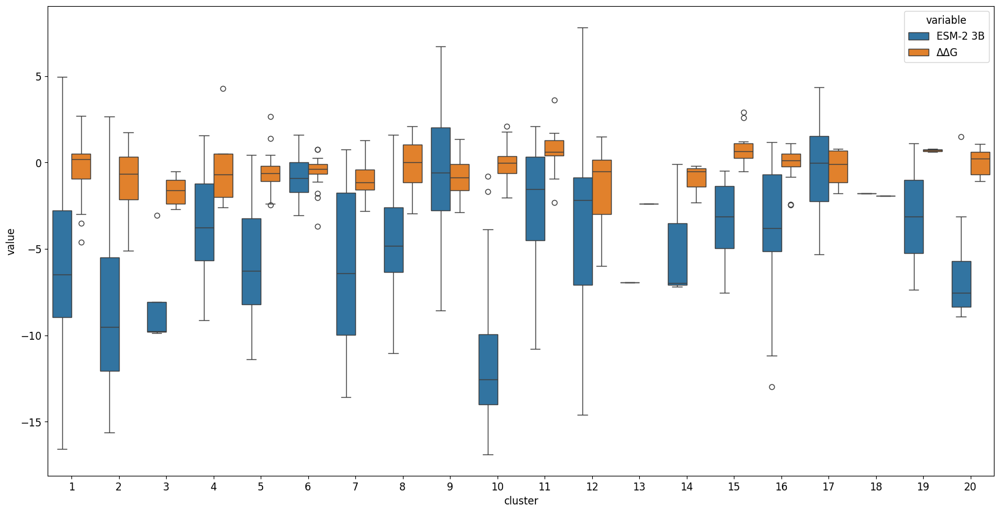

In [13]:
db_plot = db_class.copy(deep=True)
db_plot = db_plot.loc[~db_plot['ddG_dir'].isna()]
db_plot = db_plot.rename({'ddG_dir': 'ΔΔG', 'esm2_3B_dir': 'ESM-2 3B'}, axis=1)
db_plot = db_plot[['cluster', 'ESM-2 3B', 'ΔΔG']].melt(id_vars='cluster')
db_plot = db_plot.loc[db_plot['cluster']<=20]
print(db_plot)
fig, ax = plt.subplots(figsize=(20, 10))
sns.boxplot(db_plot, x='cluster', y='value', hue='variable', ax=ax)

### Supplementary Table 5

In [14]:
summ2 = analysis_utils.compute_stats(db_class, 
                                    stats=('n', 'MCC', 'tp', 'fp', 'tn', 'fn', 'auprc', 'spearman', 'accuracy', 'mse', 'net_stabilization', 'mean_stabilization', 'precision', 'recall'), 
                                    measurements=['ddG'], grouper='cluster', n_classes=2, n_bootstraps=5, quiet=True)
tmp2 = summ2.reset_index()

# < 1 minute

In [15]:
remap_names = analysis_utils.remap_names
remap_names_2 = analysis_utils.remap_names_2

remap_cols = {'auprc': 'AUPRC', 'spearman': 'Spearman\'s ρ', 'auppc': 'mean PPC', 'aumsc': 'mean MSC', 'weighted_ndcg': 'wNDCG', 'ndcg': 'NDCG',
    'weighted_spearman': 'wρ', 'weighted_auprc': 'wAUPRC', 'tp': 'True Positives', 'sensitivity': 'Sensitivity', 'mean_stabilization': 'Mean Stabilization',
    'net_stabilization': 'Net Stabilization', 'accuracy': 'Accuracy', 'mean_reciprocal_rank': 'MRR', 'n': 'n', 'MCC': 'MCC', 'recall@k1.0': 'Recall @ k',
    'mean_squared_error': 'MSE'}

new_remap_cols = {}
for key, value in remap_cols.items():
    new_remap_cols[key + '_mean'] = value + ' mean'
    new_remap_cols[key + '_std'] = value + ' stdev'

s2 = summ2.sort_values('mean_squared_error_mean', ascending=True).dropna(how='all', axis=1).reset_index()
s3 = s2.loc[s2['model'].isin(original_pred_cols_reduced + ['random_dir', 'ddG_dir'])].drop('measurement', axis=1)
s4 = s3[['model_type', 'model', 
    'mean_squared_error_mean', 'mean_squared_error_std',
    'accuracy_mean', 'accuracy_std',
    'spearman_mean', 'spearman_std',
    'weighted_spearman_mean', 'weighted_spearman_std',
    'net_stabilization_mean', 'net_stabilization_std',
    ]]
s4['model'] = s4['model'].map(remap_names_2)
s5 = s4.set_index(['model_type', 'model'])
s5.columns = [new_remap_cols[c] for c in s5.columns]
s5
# Iterate over the DataFrame and update the mean columns
for column in s5.columns:
    if 'mean' in column:
        stdev_column = column.replace('mean', 'stdev')
        s5[column] = s5[column].round(3).astype(str) + ' ± ' + s5[stdev_column].round(2).astype(str)

# Drop the standard deviation columns
s5 = s5[[col for col in s5.columns if 'stdev' not in col]]
s5.columns = [col[:-5] for col in s5.columns]
s6 = s5.reset_index().rename({'model_type': 'Model Type', 'model': 'Model'}, axis=1)
s6

,Model Type,Model,MSE,Accuracy,Spearman's ρ,wρ,Net Stabilization
0,unknown,ΔΔG label,0.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,887.012 ± 346.73
1,potential,KORPM,1.908 ± 0.53,0.713 ± 0.04,0.546 ± 0.04,0.446 ± 0.03,39.388 ± 122.63
2,structural,ESM-IF,3.337 ± 1.38,0.678 ± 0.06,0.426 ± 0.12,0.401 ± 0.02,144.059 ± 72.33
3,structural,ESM-IF(M),3.34 ± 1.38,0.674 ± 0.06,0.417 ± 0.13,0.392 ± 0.02,130.615 ± 65.95
4,evolutionary,Tranception,3.394 ± 1.39,0.632 ± 0.06,0.338 ± 0.11,0.21 ± 0.05,64.278 ± 27.75
5,unknown,Gaussian Noise,4.372 ± 1.43,0.507 ± 0.01,0.04 ± 0.01,0.021 ± 0.02,-1487.44 ± 1197.94
6,structural,ProteinMPNN 0.3,6.742 ± 1.66,0.684 ± 0.05,0.478 ± 0.09,0.406 ± 0.04,127.815 ± 52.89
7,structural,ProteinMPNN 0.2,7.212 ± 1.79,0.693 ± 0.06,0.476 ± 0.11,0.386 ± 0.04,136.187 ± 69.5
8,structural,ProteinMPNN 0.1,7.809 ± 1.76,0.684 ± 0.06,0.47 ± 0.09,0.364 ± 0.04,148.482 ± 68.66
9,evolutionary,ESM-2 150M,20.061 ± 6.15,0.654 ± 0.05,0.308 ± 0.13,0.232 ± 0.02,-46.034 ± 163.54


### Figure 1

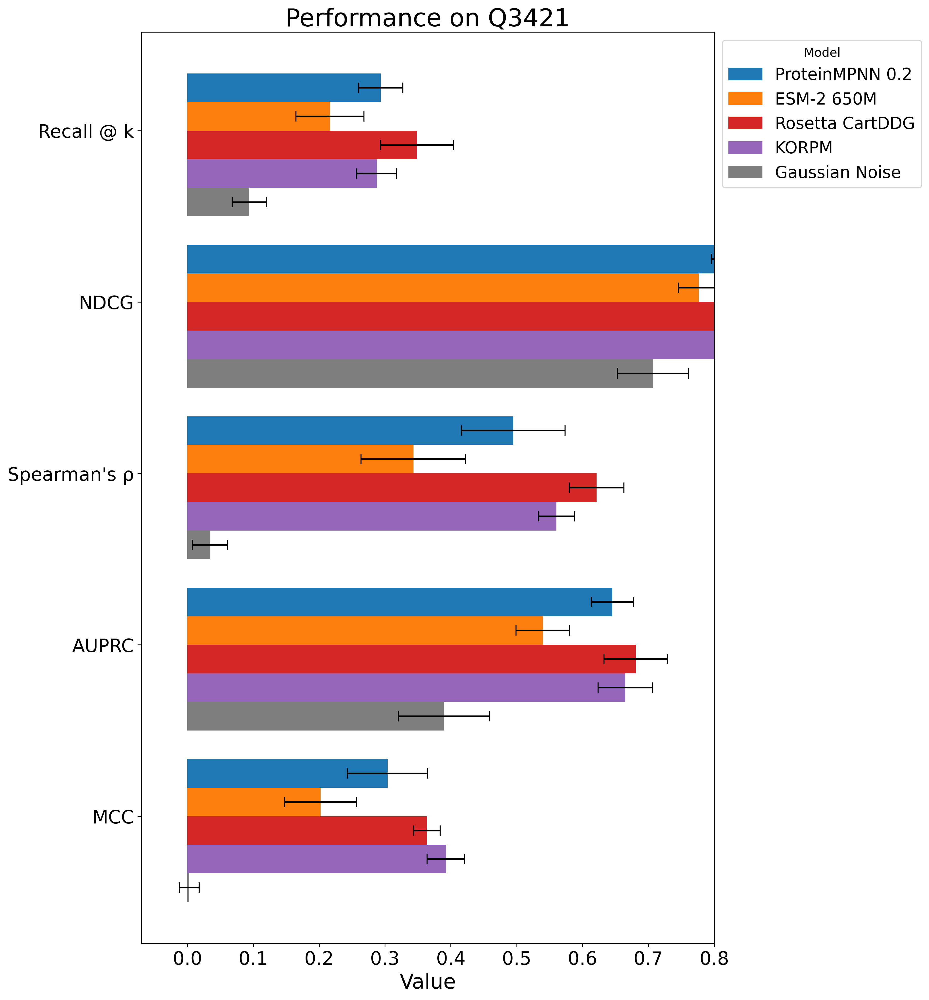

In [16]:
tmp3 = tmp1.copy(deep=True)

remap_cols = {'auprc': 'AUPRC', 'spearman': 'Spearman\'s ρ', 'auppc': 'mean PPC', 'aumsc': 'mean MSC', 'weighted_ndcg': 'wNDCG', 'ndcg': 'NDCG',
    'weighted_spearman': 'wρ', 'weighted_auprc': 'wAUPRC', 'tp': 'True Positives', 'sensitivity': 'Sensitivity', 'mean_stabilization': 'Mean Stabilization',
    'net_stabilization': 'Net Stabilization', 'accuracy': 'Accuracy', 'mean_reciprocal_rank': 'MRR', 'n': 'n', 'MCC': 'MCC', 'recall@k1.0': 'Recall @ k'}

new_remap_cols = {}
for key, value in remap_cols.items():
    new_remap_cols[key + '_mean'] = value + ' mean'
    new_remap_cols[key + '_std'] = value + ' stdev'

s2 = tmp3.sort_values('spearman_mean', ascending=False).dropna(how='all', axis=1).reset_index()
s4 = s2.loc[s2['model'].isin(original_pred_cols_reduced + ['random_dir', 'ddG_dir', 'mpnn_rosetta_dir'])]
s5 = s4

tmp2 = s5[[ 'model',  
            'MCC_mean', 'MCC_std',
            'auprc_mean', 'auprc_std',
            #'weighted_spearman_mean', 'weighted_spearman_std',
            'spearman_mean', 'spearman_std',
            #'weighted_ndcg_mean', 'weighted_ndcg_std',
            'ndcg_mean', 'ndcg_std',
            'recall@k1.0_mean', 'recall@k1.0_std', 
            ]].set_index('model')

tmp2.columns = [new_remap_cols[c] for c in tmp2.columns]
tmp2 = tmp2.reset_index().drop_duplicates()

analysis_utils.make_bar_chart(tmp2, models=['mpnn_20_00', 'esm2_650M', 'stability-oracle', 'cartesian_ddg', 'korpm', 'DDGun3D', 'MAESTRO', 'random'], title='Q3421', xlim=(-0.07, 0.8), figsize=(10, 16))

In [17]:
db_new = pd.read_csv('~/PSLMs/data/inference/tranception_results.csv', index_col=0)
db_new = db_new.rename({'tranception_weights_dir': 'tranception_new_dir', 'runtime_tranception_weights_dir': 'runtime_tranception_new_dir'}, axis=1)
db['uid3'] = db['code'] + '_' + (db['position']-db['offset_up']).astype(str) + db['mutation']
db_new = db.reset_index().set_index('uid3').join(db_new).reset_index().set_index('uid')
db_new[['tranception_new_dir']]

,tranception_new_dir
uid,
12CA_145R,NaN
1A23_30S,-0.109360
1A23_32L,-0.059789
1A23_32S,-0.032388
1A23_33S,-0.075979
...,...
5TR5_33Q,NaN
5TR5_37L,NaN
5TR5_55I,NaN


### Additional Figure describing correlation between predictions and scores of two selected models

     code  obs type tranception_dir mpnn_20_00_dir     marker
0    1A23    4  ddG            -0.8           -0.4   Bacteria
1    1A5E    3  ddG             0.5           -1.0  Eukaryota
2    1A7V   11  ddG        0.191344       0.050114   Bacteria
3    1ACB    4  ddG             0.8            0.4  Eukaryota
4    1AG2    5  ddG             0.3            0.8  Eukaryota
5    1AJ3   19  ddG         0.22105       0.428009  Eukaryota
6    1APS    6  ddG        0.260897       0.898645  Eukaryota
7    1ARR   28  ddG        0.143562       0.265206    Viruses
8    1AXB    3  ddG            -1.0           -0.5   Bacteria
9    1AYI    7  ddG        0.607143       0.071429   Bacteria
11   1BA3    4  ddG             0.8            0.4  Eukaryota
12   1BNI   95  ddG          0.5822       0.472525   Bacteria
13   1BPI   11  ddG        0.815492        0.55581  Eukaryota
14   1BTA   11  ddG        0.159819       0.041096   Bacteria
15   1BTL    5  ddG             0.9           -0.5   Bacteria
16   1BV

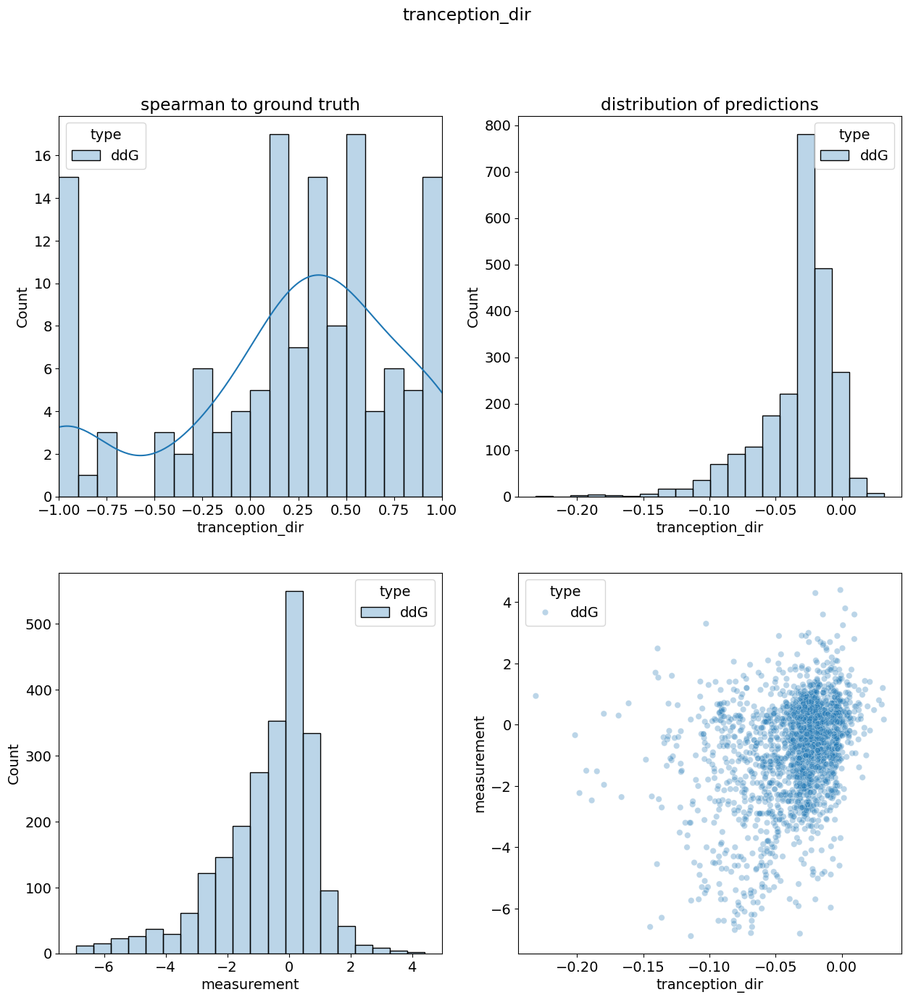

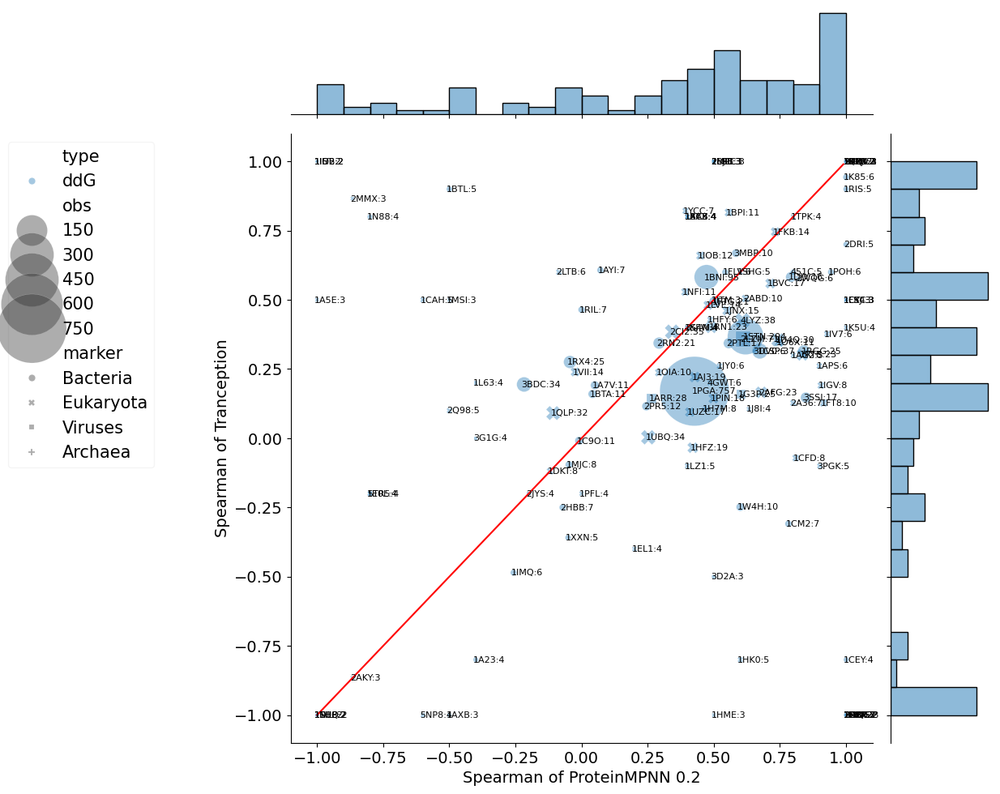

tranception_dir mpnn_20_00_dir
ddG n_total                        2339           2339
    ungrouped_spearman         0.317009        0.44787
    n_proteins                      180            180
    n_proteins_spearman             136            136
    avg_spearman               0.202313       0.354054
    weighted_spearman          0.248208       0.396635
    runtime (s)                     NaN            NaN

In [19]:
db_class_2 = db_class.copy(deep=True)
#db_class_2 = db_class_2.join(db_new[['tranception_new_dir']])
db_class_2['ddG_dir'] = db_class_2['ddG']
db_class_2['marker'] = db['origin']
db_class_2['code'] = db_class_2.reset_index('uid2').index.str[:4]
analysis_utils.correlations(db_class_2, None, stat='spearman', 
    score_name='tranception_dir', score_name_2='mpnn_20_00_dir', min_obs=1, group=True, plot=True, out=True, runtime=False)

In [20]:
db_class_2

,,mif_dir,mifst_dir,mpnn_10_00_dir,mpnn_20_00_dir,mpnn_30_00_dir,esmif_multimer_dir,esm2_3B_dir,esmif_monomer_dir,esm2_15B_half_dir,msa_1_dir,...,cartesian_ddg_dir,ddG,cluster,mpnn_rosetta_dir,random_dir,ddG_dir,korpm_pslm_rfa_5_dir,korpm_all_rfa_5_dir,marker,code
uid,uid2,,,,,,,,,,,,,,,,,,,,,
12CA_145R,12CA_140R,-7.472339,-11.654044,-0.754203,-1.014478,0.222601,0.000611,-13.121611,0.000611,-10.045898,-11.081309,...,-10.880333,-0.36,63,-11.894811,0.293021,-0.36,-0.299253,-0.415317,Eukaryota,12CA
1A23_30S,1A23_30S,1.864485,-6.805952,1.862225,2.087240,-1.396025,-0.043713,-11.571676,-0.043713,-11.668701,-8.721450,...,-1.324667,-1.80,66,0.762573,0.235462,-1.80,-0.575849,0.019297,Bacteria,1A23
1A23_32L,1A23_32L,1.119251,-7.800102,-0.200148,2.129448,-0.085721,-0.042389,-13.755667,-0.042389,-13.076172,-7.793007,...,1.818333,-4.60,66,3.947781,-0.843269,-4.60,0.419953,0.451047,Bacteria,1A23
1A23_32S,1A23_32S,-0.854073,-5.414868,0.188699,0.849972,0.863521,-0.029983,-8.291791,-0.029983,-10.436035,-5.083358,...,-4.596000,-5.20,66,-3.746028,-0.560471,-5.20,-0.404675,-0.141294,Bacteria,1A23
1A23_33S,1A23_33S,0.348253,-5.093968,0.965242,-0.514806,0.980866,-0.024960,-12.002896,-0.024961,-12.722168,-7.606897,...,-2.208667,-1.10,66,-2.723473,0.219979,-1.10,-0.839556,-0.409498,Bacteria,1A23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5TR5_33Q,5TR5_33Q,-0.197353,-0.914865,-0.652905,-0.046959,0.548482,-0.000270,-1.666809,-0.000271,-1.537109,-3.267214,...,1.595667,-0.65,10,1.548708,-0.536430,-0.65,0.128101,0.280180,Eukaryota,5TR5
5TR5_37L,5TR5_37L,-7.014242,-4.624759,-2.038346,-2.644756,-1.633662,-0.141230,-3.879099,-0.141230,-4.250977,-7.255979,...,0.726333,-0.29,10,-1.918423,-0.618129,-0.29,0.297722,-0.396573,Eukaryota,5TR5
5TR5_55I,5TR5_55I,-3.645788,-3.215672,-3.165476,-3.178130,-2.039948,-0.014492,-0.803307,-0.014492,-1.160156,-6.826414,...,-0.450000,0.24,10,-3.628130,-0.224687,0.24,0.284853,-0.080058,Eukaryota,5TR5


### Figure 4 a&b

  0%|          | 0/5 [00:00<?, ?it/s]

['ddG_dir', 'korpm_pslm_rfa_5_dir', 'cartesian_ddg_dir', 'korpm_dir', 'mif_dir', 'mpnn_20_00_dir', 'esmif_multimer_dir', 'mifst_dir', 'esm2_650M_dir', 'esm2_15B_half_dir', 'msa_transformer_mean_dir', 'ankh_dir', 'tranception_dir', 'random_dir']
class
0 >= ΔΔG > -1.5    424
ΔΔG <= -1.5        302
ΔΔG > 0            496
Name: n, dtype: int64


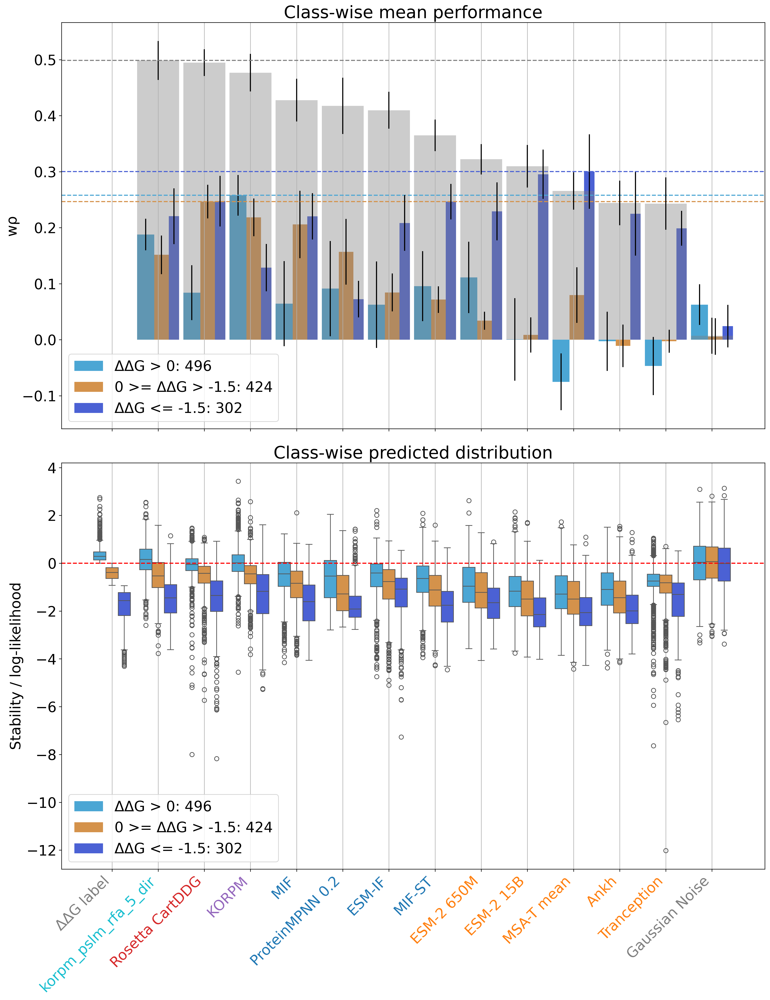

In [21]:
subset = ['korpm_pslm_rfa_5_dir',
            #'mpnn_rosetta_dir',
            'cartesian_ddg_dir',
            'korpm_dir',
            'msa_transformer_mean_dir',
            'tranception_dir',
            'esm2_650M_dir',
            'esm2_15B_half_dir',
            'ankh_dir',
            'esmif_multimer_dir',
            #'mpnn_10_00_dir',
            'mpnn_20_00_dir',
            #'mpnn_30_00_dir',
            'mif_dir',
            'mifst_dir',
            #'mutcomputex_dir',
            #'stability-oracle_dir',
            'random_dir',
            'ddG_dir']

db_complete = db_class.join(db[[c for c in db.columns if not c in db_class.columns]], how='left')
db_complete['ddG_dir'] = db_complete['ddG']
db_complete['ΔΔG'] = db_complete['ddG']
#db_complete = db_complete.loc[~db_complete['ProTherm'].astype(bool)]

current_feats = ['ΔΔG', 'ddG']
# fillna only applies to a handful of predictions from Stability Oracle
db_fig = db_complete[[c for c in db_complete if '_dir' in c or c in current_feats or c == 'cluster']].fillna(0)
d = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'ΔΔG', 
                        split_col_2 = None, 
                        threshold_1 = 0, 
                        threshold_2 = -1.5, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        statistic_2 = 'weighted_spearman',
                        n_bootstraps= 5,
                        count_muts = True,
                        subset = subset,
                        grouper = 'cluster'
                        )  
# < 10 seconds

### Figure 4 c&d

  0%|          | 0/5 [00:00<?, ?it/s]

conservation > 80% : 586
conservation <= 80% : 802
['ddG_dir', 'korpm_pslm_rfa_5_dir', 'cartesian_ddg_dir', 'korpm_dir', 'mpnn_20_00_dir', 'mif_dir', 'mifst_dir', 'esmif_multimer_dir', 'ankh_dir', 'esm2_15B_half_dir', 'esm2_650M_dir', 'msa_transformer_mean_dir', 'tranception_dir', 'random_dir']
class
conservation <= 80    802
conservation > 80     586
Name: n, dtype: int64


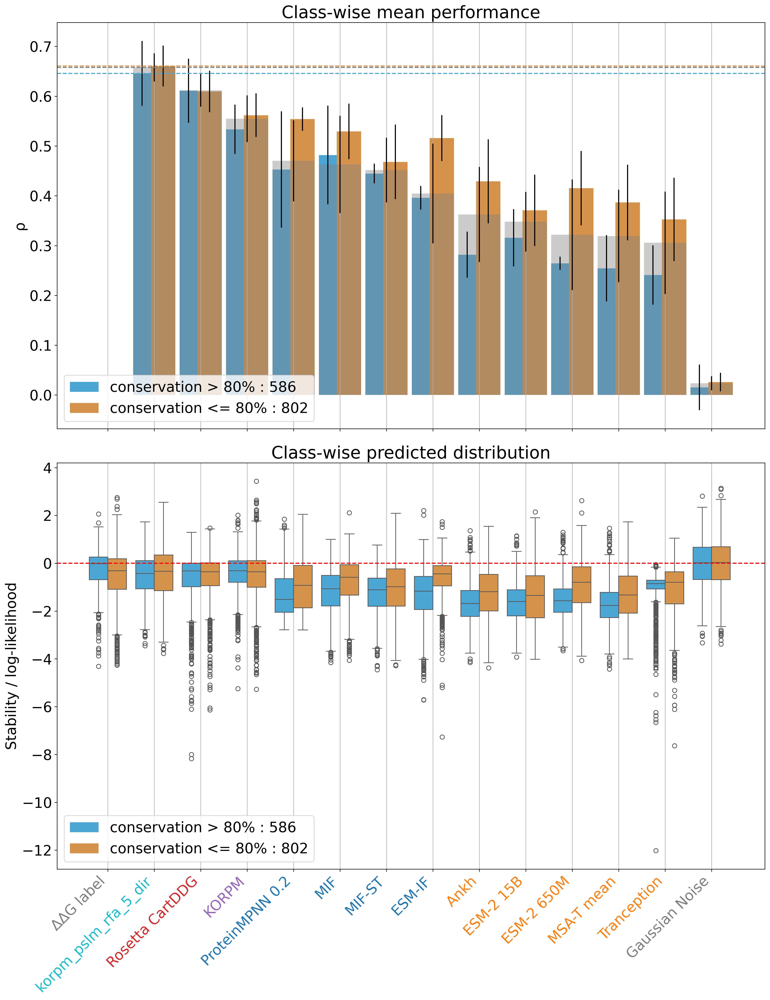

In [22]:
importlib.reload(analysis_utils)
current_feats = ['conservation', 'ddG']
db_fig = db_complete[[c for c in db_complete if '_dir' in c or c in current_feats or c == 'cluster']]
db_fig = db_fig.fillna(0)
d = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'conservation', 
                        split_col_2 = None, 
                        threshold_1 = 80, 
                        threshold_2 = None, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        #statistic_2 = 'weighted_spearman',
                        n_bootstraps= 5,
                        count_muts = True,
                        subset=subset,
                        grouper='cluster'
                        )
# < 10 seconds

### Extended Data Figure 3

In [28]:
db_complete['delta_vol_dir']

uid        uid2     
12CA_145R  12CA_140R    6.13
1A23_30S   1A23_30S    -0.83
1A23_32L   1A23_32L    -0.66
1A23_32S   1A23_32S    -3.06
1A23_33S   1A23_33S    -0.83
                        ... 
5TR5_33Q   5TR5_33Q    -2.18
5TR5_37L   5TR5_37L     1.28
5TR5_55I   5TR5_55I     1.40
5VP3_39K   5VP3_39K    -1.36
5VP3_183T  5VP3_183T   -0.40
Name: delta_vol_dir, Length: 2369, dtype: float64

  0%|          | 0/10 [00:00<?, ?it/s]

['ddG_dir', 'korpm_pslm_rfa_5_dir', 'cartesian_ddg_dir', 'korpm_dir', 'mpnn_10_00_dir', 'mpnn_30_00_dir', 'mif_dir', 'mifst_dir', 'esmif_multimer_dir', 'esm2_15B_half_dir', 'ankh_dir', 'esm2_650M_dir', 'msa_transformer_mean_dir', 'tranception_dir', 'random_dir']
class
1 >= delta_vol > -1    376
delta_vol <= -1        587
delta_vol > 1          493
Name: n, dtype: int64


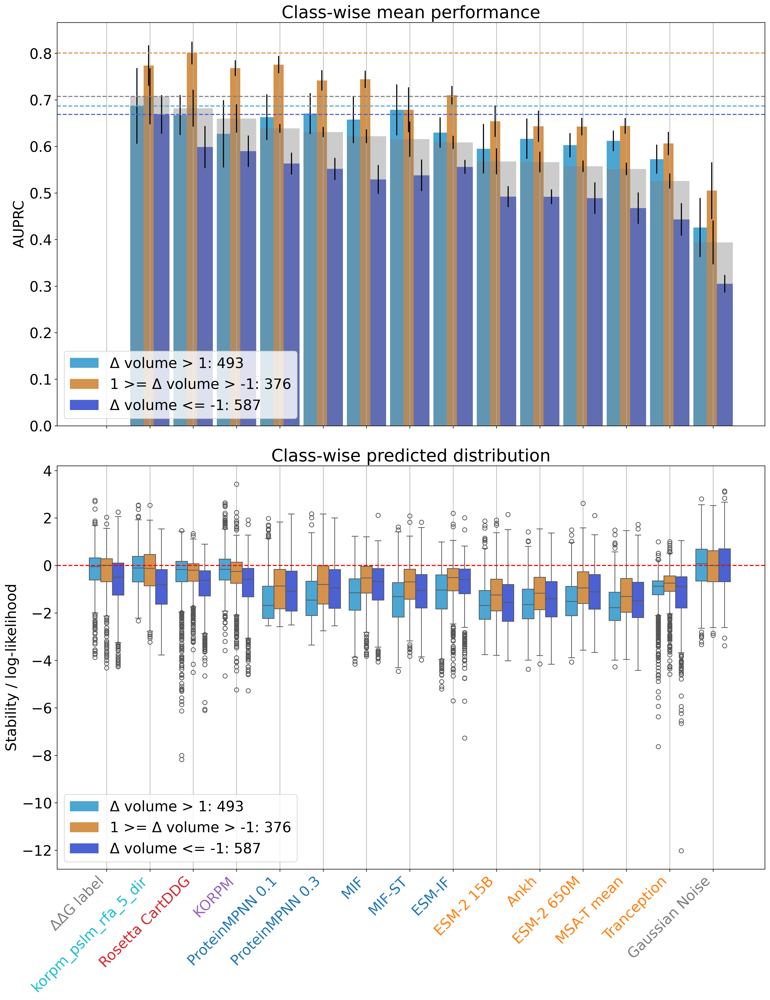

In [37]:
subset = ['korpm_pslm_rfa_5_dir',
            #'mpnn_rosetta_dir',
            'cartesian_ddg_dir',
            'korpm_dir',
            'msa_transformer_mean_dir',
            'tranception_dir',
            'esm2_650M_dir',
            'esm2_15B_half_dir',
            'ankh_dir',
            'esmif_multimer_dir',
            'mpnn_10_00_dir',
            #'mpnn_20_00_dir',
            'mpnn_30_00_dir',
            'mif_dir',
            'mifst_dir',
            #'mutcomputex_dir',
            #'stability-oracle_dir',
            'random_dir',
            'ddG_dir']

# Figure 1 c + d

db_fig = db_complete[[c for c in db_complete if '_dir' in c or c in current_feats or c == 'cluster']]
db_fig = db_fig.rename({'delta_vol_dir': 'delta_vol'}, axis=1)
db_fig = db_fig.fillna(0)
d = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'delta_vol', 
                        split_col_2 = None, 
                        threshold_1 = 1, 
                        threshold_2 = -1, 
                        measurement = 'ddG',
                        statistic = 'auprc',
                        #statistic_2 = 'weighted_spearman',
                        n_bootstraps=10,
                        count_muts = True,
                        subset=subset,
                        grouper='cluster'
                        )
# < 10 seconds

### Extended Data Figure 4

  0%|          | 0/5 [00:00<?, ?it/s]

['ddG_dir', 'korpm_pslm_rfa_5_dir', 'cartesian_ddg_dir', 'korpm_dir', 'mpnn_10_00_dir', 'mpnn_30_00_dir', 'mifst_dir', 'mif_dir', 'esmif_multimer_dir', 'ankh_dir', 'esm2_15B_half_dir', 'msa_transformer_mean_dir', 'esm2_650M_dir', 'tranception_dir', 'random_dir']
class
delta_kdh <= 0 & rel_ASA <= 0.2    323
delta_kdh <= 0 & rel_ASA > 0.2     476
delta_kdh > 0 & rel_ASA <= 0.2     222
delta_kdh > 0 & rel_ASA > 0.2      663
Name: n, dtype: int64


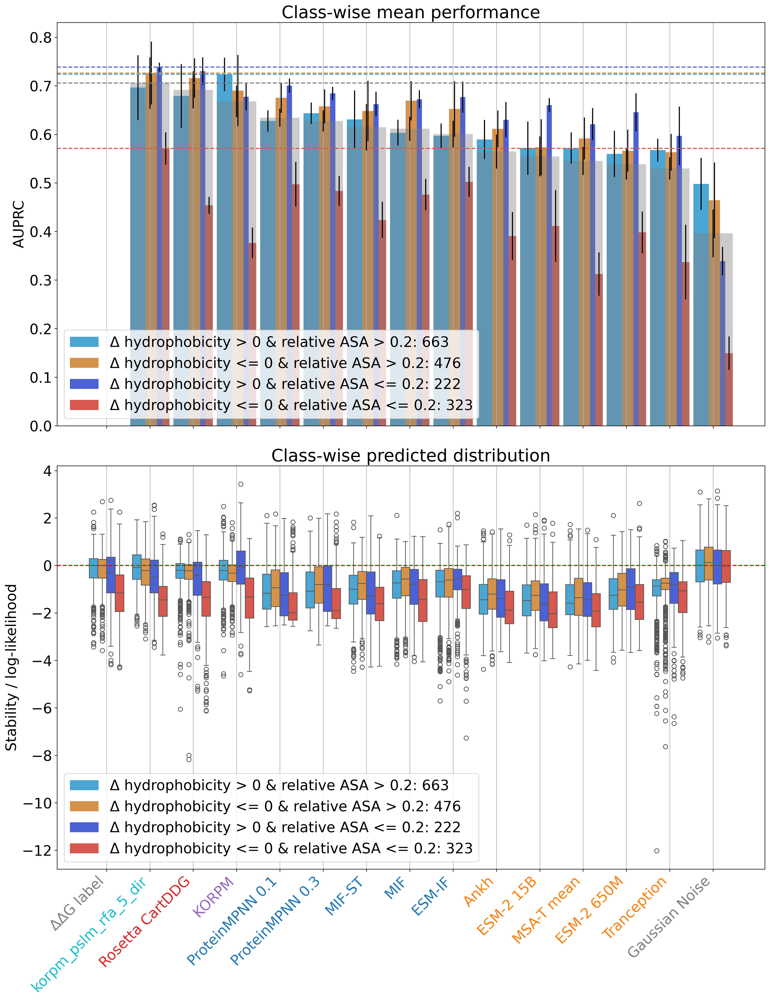

In [36]:
current_feats = ['delta_kdh', 'rel_ASA', 'ddG']
db_fig = db_complete[[c for c in db_complete if '_dir' in c or c in current_feats or c == 'cluster']]
l1 = len(db_fig)
db_fig = db_fig.fillna(0)
#db_fig = db_fig.drop(['delta_kdh_dir', 'rel_ASA_dir'], axis=1)
db_fig = db_fig.rename({'delta_kdh_dir': 'delta_kdh', 'rel_ASA_dir': 'rel_ASA'}, axis=1)
d = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'delta_kdh', 
                        split_col_2 = 'rel_ASA', 
                        threshold_1 = 0, 
                        threshold_2 = 0.2, 
                        measurement = 'ddG',
                        statistic = 'auprc',
                        #statistic_2 = 'weighted_spearman',
                        n_bootstraps=5,
                        count_muts = True,
                        subset=subset,
                        grouper='cluster'
                        )
# < 10 seconds

### Generating the pairwise ensembles used in the model complementarity section

In [ ]:
zs_feats = ['rel_ASA', 'delta_kdh', 'delta_vol', 'delta_chg']
models = original_pred_cols_reduced + [c + '_dir' for c in zs_feats]
models += ['mpnn_mean_dir', 'esmif_mean_dir', 'esm2_mean_dir', 'mif_mean_dir']

#db_summ = db_preds.join(db_ddg).join(db_cluster)
db_summ = db_class
db_summ['ddG_dir'] = db_summ['ddG']
db_summ['random_dir'] = np.random.normal(loc=0, size=len(db_summ))

dfm = db_summ.join(db_feats_2[zs_feats].drop_duplicates(), how='left')
#dfm['code'] = dfm.reset_index('uid2').index.str[:4]
ren = dict(zip(zs_feats, [f+'_dir' for f in zs_feats]))
dfm = dfm.rename(ren, axis=1)
dfr = db_runtimes.copy(deep=True).reset_index(level=0, drop=True)#.drop('uid', axis=1)
dfr['code'] = dfr.index.str[:4]
dfr[['runtime_' + r for r in ['rel_ASA_dir', 'delta_kdh_dir', 'delta_vol_dir', 'delta_chg_dir']]] = 0

weights = [1, 0.5, 0.2] #, -0.2] # could include -0.2 to allow for subtracting models
weights2 = [] # fill in weights to test 3-model ensembles
#weights2 = [0.8, 0.3]

all_cols = []

tmp_preds = []
tmp_runtimes = []
for model1 in models:
    for model2 in models:
        if model1 != model2:
            for weight in weights:
                tmp_preds.append(pd.Series(dfm[model1]/dfm[model1].std() + dfm[model2]/dfm[model2].std() * weight, name=f'{model1} + {model2} * {weight}'))
                #tmp_preds.append(pd.Series((dfm[model1]-dfm[model1].min())/dfm[model1].max() + (dfm[model2]-dfm[model2].min())/dfm[model1].max() * weight, name=f'{model1} + {model2} * {weight}'))
                all_cols.append(f'{model1} + {model2} * {weight}')
                tmp_runtimes.append(pd.Series(dfr['runtime_'+model1] + dfr['runtime_'+model2], name=f'runtime_'+all_cols[-1]))
                for model3 in models:
                    if model3 != model2:
                    #if (model1.split('_')[0] != model3.split('_')[0]) and (model2.split('_')[0] != model3.split('_')[0]):
                        for weight2 in weights2:
                            tmp_preds.append(pd.Series(dfm[model1]/dfm[model1].std() + dfm[model2]/dfm[model2].std() * weight + dfm[model3]/dfm[model3].std() * weight2, name=f'{model1} + {model2} * {weight} + {model3} * {weight2}'))
                            #tmp_preds.append(pd.Series((dfm[model1]-dfm[model1].min())/dfm[model1].max() + (dfm[model2]-dfm[model2].min())/dfm[model2].max() * weight + (dfm[model3]-dfm[model3].min())/dfm[model3].max() * weight2, name=f'{model1} + {model2} * {weight} + {model3} * {weight2}'))
                            all_cols.append(f'{model1} + {model2} * {weight} + {model3} * {weight2}')
                            #tmp_runtimes.append(pd.Series(dfr['runtime_'+model1] + dfr['runtime_'+model2] + dfr['runtime_'+model3], name='runtime_'+all_cols[-1]))

print('concatenating')
dfm = pd.concat([dfm] + tmp_preds, axis=1)
dfr = pd.concat([dfr] + tmp_runtimes, axis=1)
print('joining...')
dfm = dfm.join(dfr.drop('code', axis=1))

# < 10 seconds

concatenating
joining...


### Function to retrieve all the pairwise predictions (precalculated for this demo)

In [ ]:
def get_summary_df(db_complete, cols=None, class_stats=(), saveloc='../data/pairwise/q3421_pairwise.csv', overwrite=False):

    if not overwrite:
        assert not os.path.exists(saveloc)
    if cols is None:
        cols = db_complete.columns

    df_summ = analysis_utils.compute_stats(db_complete[cols], stats=class_stats, measurements=['ddG'], grouper='cluster').reset_index().set_index(['measurement', 'model'])
    df_summ = df_summ.reset_index().rename({'index': 'model'}, axis=1)
    df_summ = df_summ.set_index(['measurement', 'model_type', 'model', 'class'])

    df_summ.to_csv(saveloc)
    return df_summ

#d1 = get_summary_df(dfm, saveloc=os.path.join(path, 'data', 'ensemble_q3421_2_models_3_weights_x3.csv'), overwrite=True)

### Pairwise statistics for all model combinations

In [ ]:
# compute all statistics on the combined set (already done, takes ~12 hours)
d1 = pd.read_csv(os.path.join(path, 'data', 'pairwise', 'pairwise_q3421_combinations_3_weights.csv')).set_index(['measurement', 'model_type', 'model', 'class'])
d1.xs('ddG').sort_values('aumsc', ascending=False).iloc[:20, 13:]

auroc  \
model_type  model                                          class             
NaN         ddG_dir                                        NaN    1.000000   
            stability-oracle_dir + rel_ASA_dir * 0.2       NaN    0.751689   
            stability-oracle_dir + delta_vol_dir * 0.2     NaN    0.761829   
biophysical cartesian_ddg_dir + rel_ASA_dir * 0.2          NaN    0.749615   
structural  cartesian_ddg_dir + mpnn_20_00_dir * 0.5       NaN    0.783180   
NaN         stability-oracle_dir + delta_kdh_dir * 0.2     NaN    0.751038   
structural  mpnn_rosetta_dir                               NaN    0.783273   
            cartesian_ddg_dir + mpnn_mean_dir * 0.5        NaN    0.784014   
            esmif_multimer_dir + delta_vol_dir * 0.2       NaN    0.716473   
NaN         stability-oracle_dir + delta_chg_dir * 0.2     NaN    0.755111   
structural  cartesian_ddg_dir + mpnn_mean_dir * 1          NaN    0.778275   
            mpnn_mean_dir + cartesian_ddg_dir * 1          NaN    0.778275   
            cartesian_ddg_dir + esmif_multimer_dir * 0.5   NaN    0.767802   
biophysical cartesian_ddg_dir + stability-oracle_dir * 0.5 NaN    0.791328   
NaN         stability-oracle_dir + delta_vol_dir * 0.5     NaN    0.746402   
structural  cartesian_ddg_dir + mif_mean_dir * 0.5         NaN    0.764681   
            cartesian_ddg_dir + mif_dir * 1                NaN    0.766306   
            mif_dir + cartesian_ddg_dir * 1                NaN    0.766306   
            cartesian_ddg_dir + esmif_mean_dir * 0.5       NaN    0.765972   
            mpnn_10_00_dir + cartesian_ddg_dir * 1         NaN    0.776990   

                                                                     auprc  \
model_type  model                                          class             
NaN         ddG_dir                                        NaN    1.000000   
            stability-oracle_dir + rel_ASA_dir * 0.2       NaN    0.482721   
            stability-oracle_dir + delta_vol_dir * 0.2     NaN    0.500235   
biophysical cartesian_ddg_dir + rel_ASA_dir * 0.2          NaN    0.474306   
structural  cartesian_ddg_dir + mpnn_20_00_dir * 0.5       NaN    0.529519   
NaN         stability-oracle_dir + delta_kdh_dir * 0.2     NaN    0.482722   
structural  mpnn_rosetta_dir                               NaN    0.528968   
            cartesian_ddg_dir + mpnn_mean_dir * 0.5        NaN    0.532751   
            esmif_multimer_dir + delta_vol_dir * 0.2       NaN    0.475154   
NaN         stability-oracle_dir + delta_chg_dir * 0.2     NaN    0.492798   
structural  cartesian_ddg_dir + mpnn_mean_dir * 1          NaN    0.532617   
            mpnn_mean_dir + cartesian_ddg_dir * 1          NaN    0.532617   
            cartesian_ddg_dir + esmif_multimer_dir * 0.5   NaN    0.503470   
biophysical cartesian_ddg_dir + stability-oracle_dir * 0.5 NaN    0.522532   
NaN         stability-oracle_dir + delta_vol_dir * 0.5     NaN    0.473575   
structural  cartesian_ddg_dir + mif_mean_dir * 0.5         NaN    0.503441   
            cartesian_ddg_dir + mif_dir * 1                NaN    0.506585   
            mif_dir + cartesian_ddg_dir * 1                NaN    0.506585   
            cartesian_ddg_dir + esmif_mean_dir * 0.5       NaN    0.500644   
            mpnn_10_00_dir + cartesian_ddg_dir * 1         NaN    0.526972   

                                                                  0.0_n_stable  \
model_type  model                                          class                 
NaN         ddG_dir                                        NaN           631.0   
            stability-oracle_dir + rel_ASA_dir * 0.2       NaN           623.0   
            stability-oracle_dir + delta_vol_dir * 0.2     NaN           626.0   
biophysical cartesian_ddg_dir + rel_ASA_dir * 0.2          NaN           624.0   
structural  cartesian_ddg_dir + mpnn_20_00_dir * 0.5       NaN           761.0   
NaN         stability-oracle_dir + delta_kdh_dir * 0.2     Na

### Supplementary Figure 7

3421


  0%|          | 0/5 [00:00<?, ?it/s]

0.09391627787014534
['Stability Oracle', 'Rosetta CartDDG', 'ProteinMPNN 0.2', 'MIF', 'ESM-IF', 'KORPM', 'MIF-ST', 'MutComputeX', 'Ankh', 'MSA-T mean', 'Tranception', 'ESM-2 3B', 'ESM-1V mean']


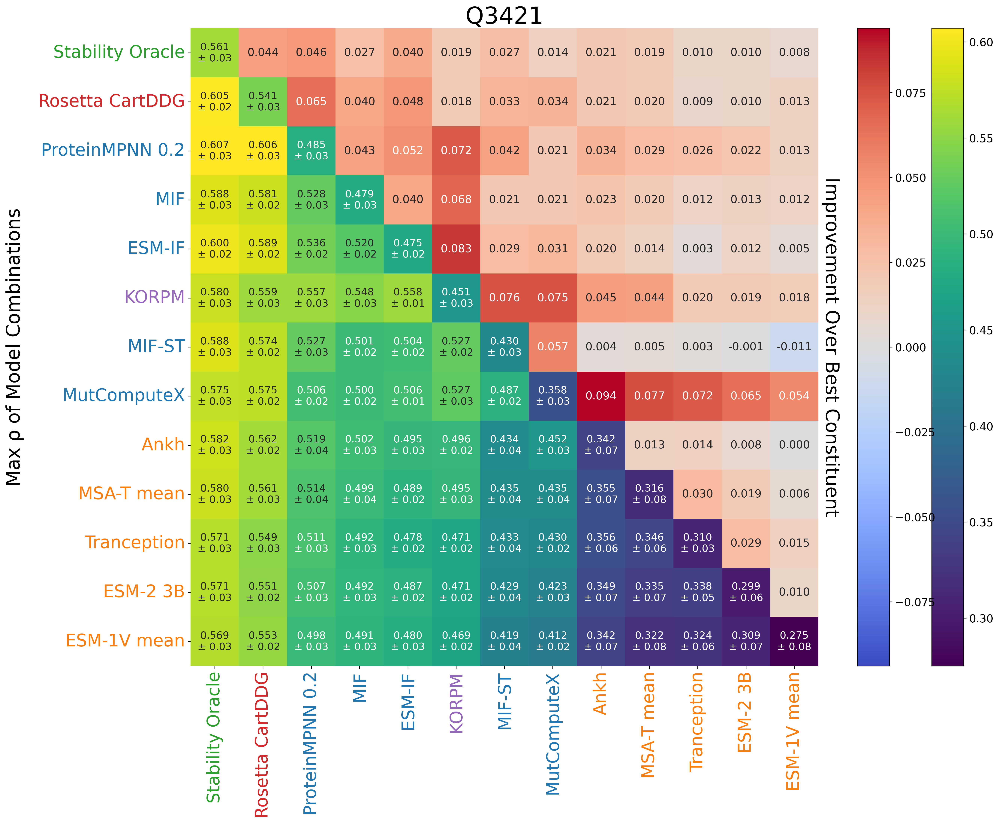

,model1,weight1,model2,weight2,mean_spearman,p_value
rank,,,,,,
1,stability-oracle_dir,1,mpnn_20_00_dir,0.5,0.607102,0.000031
2,cartesian_ddg_dir,1,mpnn_20_00_dir,0.5,0.605911,0.000046
3,cartesian_ddg_dir,1,stability-oracle_dir,1,0.60525,0.000401
4,stability-oracle_dir,1,mpnn_20_00_dir,1,0.601582,0.000463
5,stability-oracle_dir,1,esmif_multimer_dir,0.5,0.600449,0.003412
...,...,...,...,...,...,...
386,esm1v_mean_dir,1,esm2_dir,0.5,0.301928,0.817342
387,esm1v_mean_dir,1,ankh_dir,0.2,0.29832,0.018407
388,esm1v_mean_dir,1,msa_transformer_mean_dir,0.2,0.29563,0.270554


In [ ]:
subset2 = [
            'cartesian_ddg_dir',
            'esm1v_mean_dir',
            'msa_transformer_mean_dir',
            'tranception_dir',
            'ankh_dir',
            'esm2_dir',
            'esmif_multimer_dir',
            'mpnn_20_00_dir',
            'mif_dir',
            'mifst_dir',
            'korpm_dir',
            'mutcomputex_dir',
            'stability-oracle_dir'
        ]

measurement = 'ddG'
statistic = 'spearman'
upper = 'delta'

d3 = d1.copy(deep=True)
d3 = d3.reset_index()
d3 = d3.set_index(['measurement', 'model_type', 'model', 'class'])
d3 = d3.drop([c for c in d3.columns if 'pos_' in c], axis=1)

stat_df, delta_df = analysis_utils.model_combinations_heatmap(d3, dfm.fillna(0), db_ddg, statistic, measurement, n_bootstraps=5, upper=upper, subset=subset2, title='Q3421')
stat_df = stat_df.sort_values(f'mean_{statistic}', ascending=False).drop_duplicates(subset=['weight1', 'weight2', f'mean_{statistic}'])
stat_df['standardized_pair'] = stat_df.apply(lambda x: '_'.join(sorted([x['model1'] + str(x['weight1']), x['model2'] + str(x['weight2'])])), axis=1)
stat_df = stat_df.drop_duplicates(subset='standardized_pair')
stat_df = stat_df.drop(columns='standardized_pair').reset_index(drop=True).reset_index()
stat_df = stat_df.rename({'index': 'rank'}, axis=1)
stat_df['rank'] += 1
stat_df = stat_df.set_index('rank')
stat_df

### Extra Figure (not in text) showing Net Stabilization instead

3421


  0%|          | 0/5 [00:00<?, ?it/s]

144.19
['Rosetta CartDDG', 'Tranception', 'ESM-IF', 'MIF-ST', 'ProteinMPNN 0.2', 'Ankh', 'ESM-2 3B', 'MSA-T mean', 'MIF', 'MutComputeX', 'Stability Oracle', 'ESM-1V mean', 'KORPM']


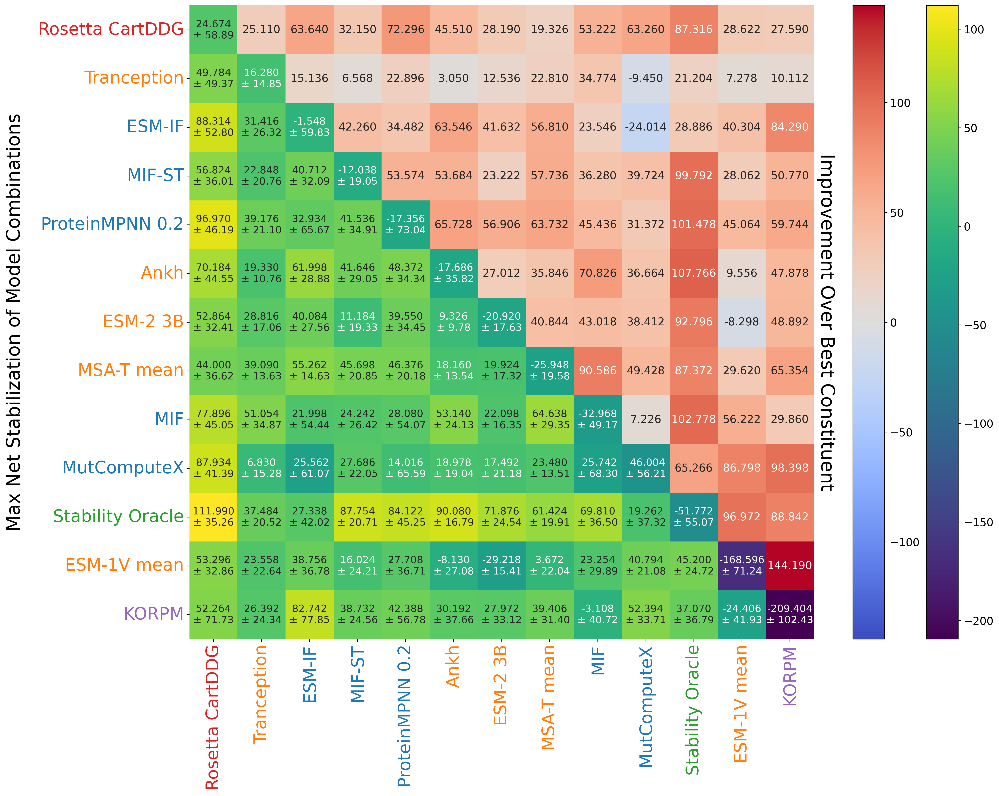

,model1,weight1,model2,weight2,mean_net_stabilization,p_value
rank,,,,,,
1,cartesian_ddg_dir,1,stability-oracle_dir,0.5,111.99,0.0028
2,stability-oracle_dir,1,cartesian_ddg_dir,1,102.278,0.017209
3,cartesian_ddg_dir,1,mpnn_20_00_dir,0.5,96.97,0.031746
4,cartesian_ddg_dir,1,mpnn_20_00_dir,0.2,91.388,0.028566
5,stability-oracle_dir,1,ankh_dir,0.2,90.08,0.001386
...,...,...,...,...,...,...
386,korpm_dir,1,stability-oracle_dir,0.2,-78.856,0.566594
387,korpm_dir,1,tranception_dir,0.2,-87.286,0.041322
388,korpm_dir,1,esm2_dir,0.2,-89.992,0.014074


In [ ]:
measurement = 'ddG'
statistic = 'net_stabilization'
upper = 'delta'

d3 = d1.copy(deep=True)
d3 = d3.reset_index()
d3 = d3.set_index(['measurement', 'model_type', 'model', 'class'])
d3 = d3.drop([c for c in d3.columns if 'pos_' in c], axis=1)

stat_df, delta_df = analysis_utils.model_combinations_heatmap(d3, dfm.fillna(0), db_ddg, statistic, measurement, n_bootstraps=5, upper=upper, subset=subset2)
stat_df = stat_df.sort_values(f'mean_{statistic}', ascending=False).drop_duplicates(subset=['weight1', 'weight2', f'mean_{statistic}'])
stat_df['standardized_pair'] = stat_df.apply(lambda x: '_'.join(sorted([x['model1'] + str(x['weight1']), x['model2'] + str(x['weight2'])])), axis=1)
stat_df = stat_df.drop_duplicates(subset='standardized_pair')
stat_df = stat_df.drop(columns='standardized_pair').reset_index(drop=True).reset_index()
stat_df = stat_df.rename({'index': 'rank'}, axis=1)
stat_df['rank'] += 1
stat_df = stat_df.set_index('rank')
#stat_df.loc[stat_df['runtime_gpu']<0, 'runtime_gpu'] = np.nan
stat_df

# ~ 10 seconds

### Supplementary Figure 8

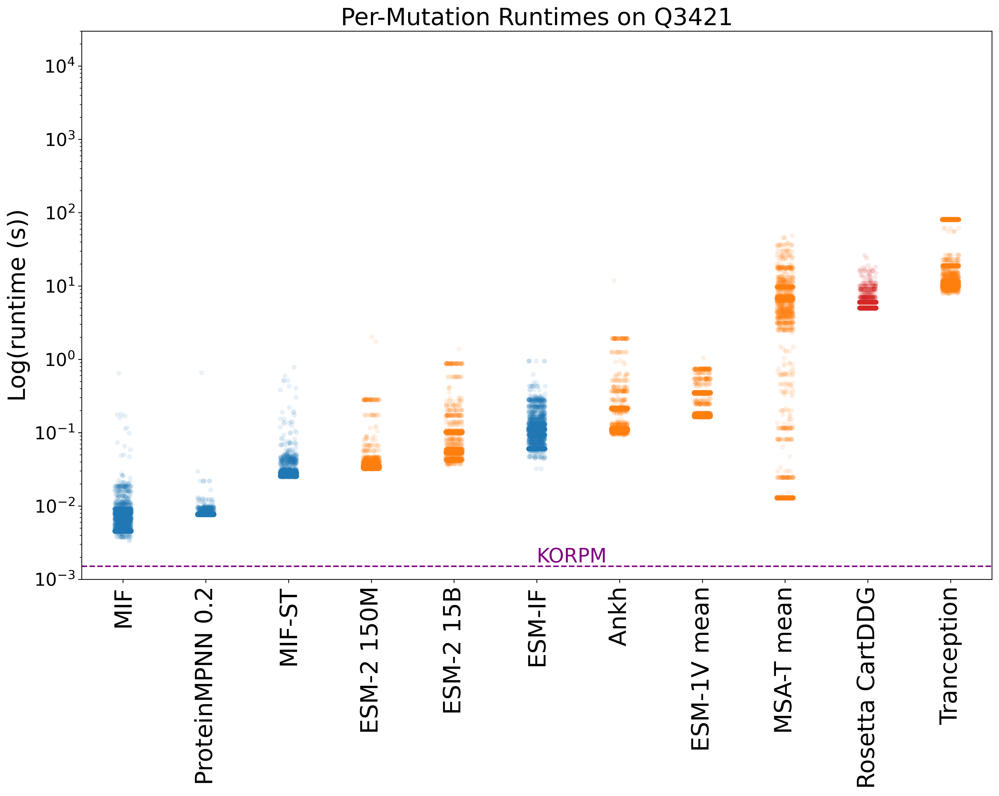

In [25]:
int_runtimes = db_runtimes.dropna(axis=1, how='all')#.groupby('code').mean()#.sum() #uncomment to get mean per protein
int_runtimes = int_runtimes[[
                             'runtime_esmif_multimer_dir',
                             'runtime_mif_dir',
                             'runtime_mifst_dir',
                             'runtime_mpnn_20_00_dir',
                             'runtime_tranception_dir',
                             'runtime_msa_transformer_mean_dir',
                             'runtime_esm1v_mean_dir',
                             'runtime_esm2_150M_dir',
                             'runtime_cartesian_ddg_dir',
                             'runtime_ankh_dir',
                             'runtime_esm2_15B_half_dir'
                            ]]

int_runtimes.columns = [c[8:-4] for c in int_runtimes.columns]
#int_runtimes.columns = int_runtimes.columns.map(analysis_utils.remap_names)
total_runtimes = int_runtimes.melt().sort_values('value')#.sum(axis=0)

### determine order for displaying runtimes
# Calculate the grouped median
grouped_median = total_runtimes.groupby('variable')['value'].median()
# Create a temporary column 'group_median' with the grouped medians mapped to each row
total_runtimes['group_median'] = total_runtimes['variable'].map(grouped_median)
# Sort the DataFrame first by 'group_median' and then by 'variable'
df_sorted = total_runtimes.sort_values(['group_median', 'variable'], ascending=True)
# Drop the temporary column 'group_median'
total_runtimes = df_sorted.drop(columns=['group_median'])

total_runtimes['category'] = total_runtimes['variable'].apply(lambda x: analysis_utils.determine_category(x))
total_runtimes['color'] = total_runtimes['variable'].apply(lambda x: analysis_utils.determine_base_color(x))

custom_palette = [
    (0.12156863, 0.46666667, 0.70588235),  # blue
    (1.0, 0.49803922, 0.05490196),  # orange
    (0.8392156862745098, 0.153, 0.153)  # red
]

# Set the custom palette
sns.set_palette(custom_palette)

fig, ax = plt.subplots(figsize=(1.5*total_runtimes['variable'].nunique(), 10), dpi=300)  # adjust the size here
ax = sns.stripplot(data=total_runtimes, x='variable', y='value', hue='color', alpha=0.1, legend=False)

plt.axhline(y=0.0015, color='purple', linestyle='--', label='KORPM')
plt.text(5, 0.0015, 'KORPM', color='purple', verticalalignment='bottom')

remapped_x = [remap_names[tick.get_text()] if tick.get_text() in remap_names.keys() else tick.get_text() for tick in ax.get_xticklabels()]
ax.set_xticklabels(remapped_x)
ax.set_yticklabels(remapped_x[::-1])
plt.title('Per-Mutation Runtimes on Q3421')
plt.yscale('log')
plt.ylim(10e-4, 30000)
plt.xticks(rotation=90, fontsize=24)
plt.xlabel('')
plt.yticks(fontsize=18)
plt.ylabel('Log(runtime (s))', fontsize=24)
plt.show()

### Following cells relate to preprocessing required for Supplementary Figure 2

In [26]:
neff = pd.read_csv(os.path.join(path, 'data', 'features', 'neff_s669.csv'), header=None).set_index(0) # todo / fix
neff.index.name = 'code'
neff.columns = ['neff']

s669_feats = pd.read_csv(os.path.join(path, 'data', 'features', 's669_local_mapped_feats.csv'))
s669_feats['uid'] = s669_feats['code'] + '_' + s669_feats['position_orig'].astype(str) + s669_feats['mutation']
s669_feats['uid2'] = s669_feats['code'] + '_' + s669_feats['position'].astype(str) + s669_feats['mutation']

s669_feats = s669_feats.set_index('uid')
s669_feats = s669_feats[['uid2', 'wild_type', 'on_interface', 'entropy', 'conservation', 'column_completeness', 'completeness_score', 'n_seqs', 'structure_length', 'multimer', 'SS',
                        'features', 'hbonds', 'saltbrs', 'b_factor', 'kdh_wt', 'kdh_mut', 'vol_wt', 'vol_mut', 'chg_wt', 'chg_mut', 'rel_ASA', 'is_nmr', 'pH', 'resolution',
                        'SOL_ACC_dir', 'SOL_ACC_inv']] #'residue_depth',

s669_feats['on_interface'] = s669_feats['on_interface'].astype(int)
s669_feats['features'] = s669_feats['features'].fillna("")#.apply(list)
#db_complete = db_complete.reset_index('uid').join(s669_feats.set_index('uid'))
s669_feats['delta_kdh'] = s669_feats['kdh_mut'] - s669_feats['kdh_wt']
s669_feats['delta_vol'] = s669_feats['vol_mut'] - s669_feats['vol_wt']
s669_feats['delta_chg'] = s669_feats['chg_mut'] - s669_feats['chg_wt']
s669_feats['delta_asa'] = s669_feats['SOL_ACC_inv'] - s669_feats['SOL_ACC_dir']
s669_feats['asa'] = s669_feats['SOL_ACC_dir']
s669_feats['to_proline'] = (s669_feats.index.str[-1] == 'P').astype(int)
s669_feats['to_glycine'] = (s669_feats.index.str[-1] == 'G').astype(int)
s669_feats['from_proline'] = s669_feats['wild_type'] == 'P'
s669_feats['from_glycine'] = s669_feats['wild_type'] == 'G'
s669_feats['to_alanine'] = (s669_feats.index.str[-1] == 'A').astype(int)
s669_feats['helix'] = s669_feats['SS'] == 'H'
s669_feats['bend'] = s669_feats['SS'] == 'S'
s669_feats['turn'] = s669_feats['SS'] == 'T'
s669_feats['coil'] = s669_feats['SS'] == '-'
s669_feats['strand'] = s669_feats['SS'] == 'E'
#s669_feats['xray_else_NMR'] = s669_feats['nmr_xray'].str.contains('X-RAY')
s669_feats['active_site'] = s669_feats['features'].str.contains('ACT_SITE')
s669_feats['resolution'] = s669_feats['resolution'].fillna('').apply(lambda x: analysis_utils.extract_decimal_number(x))
#s669_feats['mpnn_median_dir'] = s669_feats[['mpnn_20_021_dir', 'mpnn_20_022_dir', 'mpnn_20_019_dir']].mean(axis=1)
s669_feats = s669_feats.drop(['kdh_wt', 'kdh_mut', 'vol_wt', 'vol_mut', 'chg_wt', 'chg_mut', 'features', 'SS', 'wild_type'], axis=1)
# 'mpnn_20_021_dir', 'mpnn_20_022_dir', 'mpnn_20_019_dir', 'mpnn_10_dir', 'mpnn_30_dir', 'mpnn_30_03_dir', 'mpnn_20_02_dir',
s669_feats['code'] = s669_feats.index.str[:4]
s669_feats = s669_feats.reset_index().merge(neff['neff'].dropna(), on='code', how='left').drop('code', axis=1)#.set_index('uid')
s669_feats['neff'] = s669_feats['neff'].fillna(0)
s669_feats = s669_feats.groupby('uid').max()
s669_feats = s669_feats.reset_index().set_index(['uid', 'uid2'])

# preprocess S461 to align with S669
s461 = pd.read_csv(os.path.join(path, 'data', 'external_datasets', 'S461.csv'))
s461['uid'] = s461['PDB'] + '_' + s461['MUT_D'].str[2:]
s461 = s461.set_index('uid')
s461['ddG_I'] = -s461['ddG_D']
s461.columns = [s+'_dir' for s in s461.columns]
s461 = s461.rename({'ddG_D_dir': 'ddG', 'ddG_I_dir': 'ddG_inv'}, axis=1)

s461_feats = s669_feats.reset_index('uid2').join(s461[['ddG']], how='inner')

ValueError: Length mismatch: Expected axis has 2 elements, new values have 1 elements

In [ ]:
from sklearn.preprocessing import MinMaxScaler

def compare_distributions_violin(df1, df2, shared_columns=None):
    remap_names = {'delta_chg': 'Δ charge', 'delta_vol': 'Δ volume', 'hbonds': 'wt hydrogen bonds', 
                    'multimer': 'chains in assembly', 'neff': 'n effective sequences', 'b_factor': 'beta factor',
                    'rel_ASA': 'SASA', 'delta_kdh': 'Δ hydrophobicity', 'ddG': 'ΔΔG', 'structure_length': 'n residues', 
                    'completeness_score': 'alignment completeness'}

    if shared_columns is None:
        # Identify shared columns
        shared_columns = set(df1.columns).intersection(df2.columns)
        print(shared_columns)

    # Exclude boolean columns
    shared_columns = [col for col in shared_columns if df1[col].dtype != 'bool' and df2[col].dtype != 'bool']

    # Create a combined dataframe with an extra column to indicate the source dataframe
    df1_copy = df1[shared_columns].copy()
    df1_copy['source'] = 'Q3421'

    df2_copy = df2[shared_columns].copy()
    df2_copy['source'] = 'S461'

    combined_df = pd.concat([df1_copy, df2_copy])

    # Apply Min-Max Scaling
    scaler = MinMaxScaler()
    combined_df[shared_columns] = scaler.fit_transform(combined_df[shared_columns])

    # Melt the dataframe to long format for plotting
    melted_df = combined_df.melt(id_vars='source', value_vars=shared_columns)

    # Plot a violin plot for each shared column
    plt.figure(figsize=(20, 10))
    ax = sns.violinplot(x='variable', y='value', hue='source', split=True, data=melted_df, bw=0.1, inner='quart')

    for i, col in enumerate(shared_columns):
        # Calculate medians before transformation
        median_df1 = df1[col].median()
        median_df2 = df2[col].median()

        # Normalize column
        combined_col = pd.concat([df1[[col]], df2[[col]]])
        combined_col_scaled = scaler.fit_transform(combined_col)

        # Create DataFrame for violin plot
        violin_df = pd.DataFrame({
            'Column': [i]*len(combined_col),  # replace column name with numeric value
            'Value': combined_col_scaled.flatten(),
            'Source': ['df1']*len(df1) + ['df2']*len(df2)
        })

        # Plot violin
        #sns.violinplot(x='Column', y='Value', hue='Source', data=violin_df, split=True, inner=None, ax=ax)

        # Plot median markers
        median_df1_scaled = scaler.transform([[median_df1]])[0, 0]
        median_df2_scaled = scaler.transform([[median_df2]])[0, 0]
        plt.plot([i-0.2, i], [median_df1_scaled, median_df1_scaled], color='blue', linestyle='dashed')
        plt.plot([i, i+0.2], [median_df2_scaled, median_df2_scaled], color='red', linestyle='dashed')

        # Annotate median markers
        ax.text(i-0.4, median_df1_scaled, f'{median_df1:.2f}', color='blue', va='center', fontsize=10)
        ax.text(i+0.3, median_df2_scaled, f'{median_df2:.2f}', color='red', va='center', fontsize=10)

    remapped_x = [remap_names[tick.get_text()] if tick.get_text() in remap_names.keys() else tick.get_text() for tick in ax.get_xticklabels()]
    ax.set_xticklabels(remapped_x)

    plt.title('Feature Distributions for Q3421 and S461', fontsize=30)
    plt.xticks(rotation=90, fontsize=16)
    plt.yticks(rotation=90, fontsize=16)
    plt.xlabel('Feature', fontsize=24)
    plt.ylabel('Normalized Value', fontsize=24)
    plt.show()


### Supplementary Figure 2

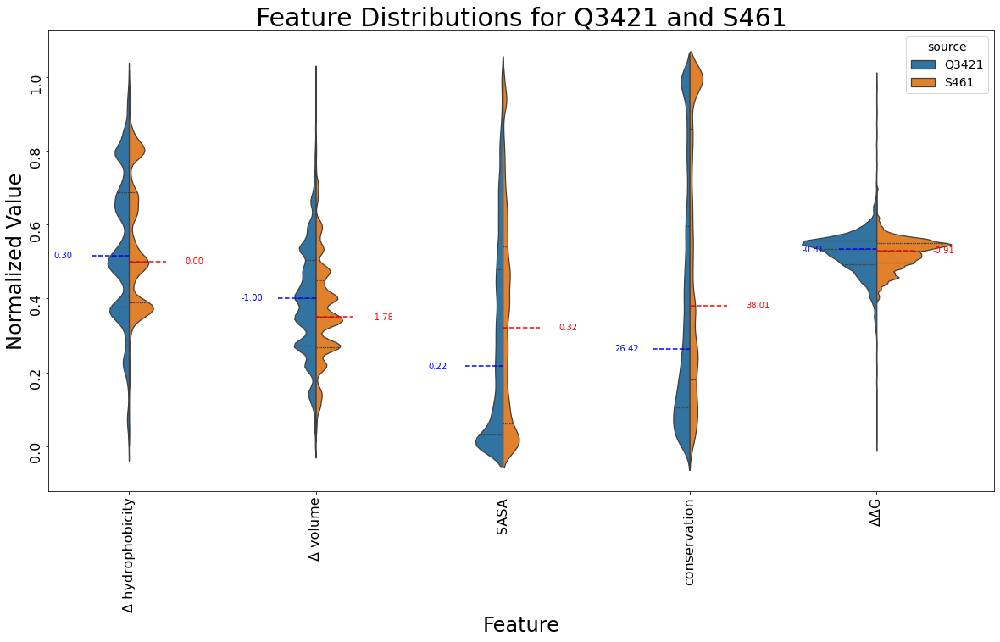

In [ ]:
compare_distributions_violin(db_feats_2.drop(['n_seqs', 'on_interface', 'column_completeness', 'saltbrs'], axis=1).join(db_ddg), s461_feats, shared_columns=['delta_kdh', 'delta_vol', 'rel_ASA', 'conservation', 'ddG'])

### Figure 5 (Methods)

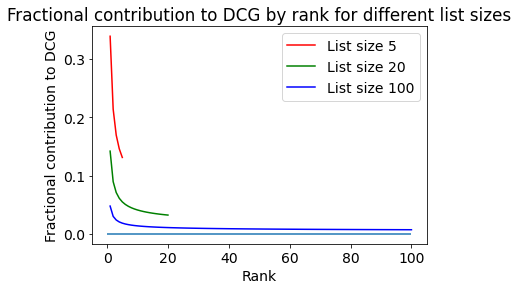

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def fractional_contributions(list_size, base=2):
    ranks = np.arange(1, list_size+1)
    discounts = 1 / np.log2(ranks + 1)  # compute the discount for each rank
    return discounts / np.sum(discounts)  # normalize to get fractional contributions

list_sizes = [5, 20, 100]
colors = ['r', 'g', 'b']

for i, list_size in enumerate(list_sizes):
    fractions = fractional_contributions(list_size)
    plt.plot(np.arange(1, list_size+1), fractions, color=colors[i], label=f'List size {list_size}')

plt.xlabel('Rank')
plt.ylabel('Fractional contribution to DCG')
plt.title('Fractional contribution to DCG by rank for different list sizes')
plt.hlines(0, 0, 100)
plt.legend()
plt.show()